---
title: Model Deployment on Feature Extracted Data
author: "Guntas Singh Saran"
date: "2024-01-24"
format:
    html:
        code-fold: false
        code-tools: true
jupyter: python3
image: "output.png"
categories: ["Classfication"]

---

# Yet to decide on Train-Val check or Inner-Outer Fold check

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from latex import latexify, format_axes
import numpy as np
import tsfel
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
import graphviz
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
from MakeDataset import *
%matplotlib inline
# Retina
%config InlineBackend.figure_format = 'retina'

Training data shape:  (108, 500, 3)
Testing data shape:  (36, 500, 3)
Validation data shape:  (36, 500, 3)


In [3]:
X_train, y_train
X_test, y_test
X_val, y_val

(180, 500, 3)

### $(a_x^2 + a_y^2 + a_z^2)$

In [2]:
X_train_TS = np.sum(np.square(X_train), axis = -1)
X_test_TS = np.sum(np.square(X_test), axis = -1)
X_val_TS = np.sum(np.square(X_val), axis = -1)
print(X_train_TS.shape, X_test_TS.shape, X_val_TS.shape)

(108, 500) (36, 500) (36, 500)


In [3]:
features_sel = ["0_Mean", "0_Variance", "0_Peak to peak distance", "0_Mean absolute deviation"]

In [4]:
classesN = {1 : 'WALKING', 2 : 'WALKING_UPSTAIRS', 3 : 'WALKING_DOWNSTAIRS', 4 : 'SITTING', 5 : 'STANDING', 6 : 'LAYING'}
namedLabel = [classesN[i] for i in y_train]
classesN

{1: 'WALKING',
 2: 'WALKING_UPSTAIRS',
 3: 'WALKING_DOWNSTAIRS',
 4: 'SITTING',
 5: 'STANDING',
 6: 'LAYING'}

In [5]:
def Featuriser(XTimeSeries, features):
    cfg = tsfel.get_features_by_domain()
    df = pd.DataFrame(XTimeSeries)
    dataFrames = []
    for i in df.index:
        dataFrames.append(tsfel.time_series_features_extractor(cfg, df.iloc[i,:], fs = 50))
    dfN = pd.concat(dataFrames, axis = 0)
    dfNFeaturized = dfN[features]
    return dfNFeaturized

## Featurising all the ```X_train_TS```, ```X_test_TS```, ```X_val_TS```

In [ ]:
dfTrain = Featuriser(X_train_TS, features_sel)
dfTest = Featuriser(X_test_TS, features_sel)
dfVal = Featuriser(X_val_TS, features_sel)

In [7]:
dfTrain.shape

(108, 4)

In [8]:
dfTest.shape

(36, 4)

In [9]:
dfVal.shape

(36, 4)

In [10]:
dfTrain

,0_Mean,0_Variance,0_Peak to peak distance,0_Mean absolute deviation
0,1.058182,0.000441,0.276308,0.010239
0,1.072680,0.000439,0.302652,0.011554
0,1.141142,0.281282,2.951101,0.382585
0,1.193139,0.442850,2.853736,0.537589
0,1.005901,0.000026,0.042222,0.004003
...,...,...,...,...
0,1.328807,1.370835,4.655614,0.995502
0,1.188371,0.436127,3.625210,0.506932
0,1.066069,0.000026,0.031092,0.004027
0,1.116685,0.245975,2.492894,0.382408


In [12]:
hyperparams = {"max_depth" : [2, 3, 4, 5, 6, 7, 8, 9, 10], "criterion" : ["gini", "entropy"], "min_samples_leaf" : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]}
hyperparams

{'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10],
 'criterion': ['gini', 'entropy'],
 'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]}

In [13]:
from itertools import product
final, counter = {}, 0
for max_depth, criteria, min_sample in product(hyperparams["max_depth"], hyperparams["criterion"], hyperparams["min_samples_leaf"]):
    model = DecisionTreeClassifier(max_depth = max_depth, criterion = criteria, min_samples_leaf = min_sample, random_state = 42)
    model.fit(dfTrain, y_train)
    val_score = model.score(dfVal, y_val)
    final[counter] = {"max_depth" : max_depth, "criterion" : criteria, "min_samples_leaf" : min_sample, "val_score" : val_score}
    counter += 1

In [14]:
hparam_df = pd.DataFrame(final).T
hparam_df

,max_depth,criterion,min_samples_leaf,val_score
0,2,gini,1,0.638889
1,2,gini,2,0.638889
2,2,gini,3,0.638889
3,2,gini,4,0.638889
4,2,gini,5,0.638889
...,...,...,...,...
265,10,entropy,11,0.694444
266,10,entropy,12,0.666667
267,10,entropy,13,0.666667
268,10,entropy,14,0.666667


In [15]:
hparam_df.sort_values(by = "val_score", ascending = False).head(10)

,max_depth,criterion,min_samples_leaf,val_score
136,6,entropy,2,0.777778
256,10,entropy,2,0.722222
255,10,entropy,1,0.722222
115,5,entropy,11,0.694444
130,6,gini,11,0.694444
220,9,gini,11,0.694444
241,10,gini,2,0.694444
100,5,gini,11,0.694444
250,10,gini,11,0.694444
190,8,gini,11,0.694444


In [16]:
dfTrain_Val_Test = pd.concat([dfTrain, dfVal, dfTest], axis = 0)
y_train_test_val = np.hstack([y_train, y_val, y_test])
dfTrain_Val_Test

,0_Mean,0_Variance,0_Peak to peak distance,0_Mean absolute deviation
0,1.058182,0.000441,0.276308,0.010239
0,1.072680,0.000439,0.302652,0.011554
0,1.141142,0.281282,2.951101,0.382585
0,1.193139,0.442850,2.853736,0.537589
0,1.005901,0.000026,0.042222,0.004003
...,...,...,...,...
0,1.012756,0.000036,0.046293,0.004625
0,1.029612,0.000035,0.055289,0.004476
0,1.221348,0.614296,3.526818,0.662692
0,1.168859,0.455832,3.239159,0.501238


In [17]:
model = DecisionTreeClassifier(max_depth = 6, min_samples_leaf = 2, criterion = "entropy", random_state = 42)
model.fit(dfTrain_Val_Test, y_train_test_val)

DecisionTreeClassifier(criterion='entropy', max_depth=6, min_samples_leaf=2,
                       random_state=42)

In [18]:
def getTimeSeries(filename):
    filePath = f"./Time Series Data/{filename}"
    df = pd.read_csv(filePath)
    return df

In [19]:
df = getTimeSeries('TS2Walking.csv')
df

,time,gFx,gFy,gFz,0
0,0.004371,-0.9965,0.1796,0.2842,1.068
1,0.005229,-1.0007,0.1845,0.2910,1.075
2,0.005670,-1.0034,0.1886,0.2964,1.080
3,0.006074,-1.0026,0.1903,0.2984,1.080
4,0.006489,-0.9985,0.1920,0.2954,1.076
...,...,...,...,...,...
19310,38.514996,-0.9303,-0.0344,0.4249,1.032
19311,38.516256,-0.9301,-0.0349,0.4234,1.031
19312,38.518234,-0.9315,-0.0347,0.4222,1.032
19313,38.520242,-0.9335,-0.0354,0.4229,1.034


In [20]:
def fetchTotTS(dataFrame):
    return pd.DataFrame(dataFrame.iloc[:, 4]**2)

In [21]:
def PlotTimeSeries(df, flag):
    latexify()
    if flag:
        plt.figure(figsize = (9, 3))
        plt.title(r"Time Series of Acceleration $(acc_x, acc_y, acc_z)$")
        colors = ["red", "green", "blue"]
        for k in range(1, 4):
            plt.plot(df.iloc[:, k], color = colors[k - 1], linewidth = 0.8)
        plt.xlabel("Time Samples")
        plt.ylabel(r"Acceleration in $m/s^2$")
        plt.legend([r"$a_x$", r"$a_y$", r"$a_z$"])
        plt.grid()
        plt.show()
    else:
        plt.figure(figsize = (9, 3))
        plt.title(r"Time Series of Total Acceleration $(acc_x^2 + acc_y^2 + acc_z^2)$")
        plt.plot(df.iloc[:, 4]**2, color = "deeppink", linewidth = 0.8)
        plt.xlabel("Time Samples")
        plt.ylabel(r"Total Acceleration in $m/s^2$")
        plt.legend([r"$(acc_x^2 + acc_y^2 + acc_z^2)$"])
        plt.grid()
        plt.show()

### $\text{Sampling Time} = \frac{\text{No. of Samples}}{f_s}$
### $f_s = 500 Hz$

In [22]:
df.shape[0] / 500.0

38.63

In [23]:
def FeaturiserN(XTimeSeries, features):
    model1 = tsfel.get_features_by_domain()
    df = pd.DataFrame(XTimeSeries).T
    dfN = tsfel.time_series_features_extractor(model1, signal_windows = list(df.iloc[0, :]), fs = 50)
    dfNFeaturized = dfN[features]
    return dfNFeaturized

In [24]:
pd.DataFrame(fetchTotTS(df.iloc[2500:7500, :])).T

,2500,2501,2502,2503,2504,2505,2506,2507,2508,2509,...,7490,7491,7492,7493,7494,7495,7496,7497,7498,7499
0,0.751689,0.755161,0.758641,0.765625,0.776161,0.786769,0.799236,0.808201,0.817216,0.8281,...,1.646089,1.565001,1.517824,1.485961,1.452025,1.420864,1.3924,1.364224,1.331716,1.301881


In [25]:
dfN1 = FeaturiserN(fetchTotTS(df.iloc[2500:7500, :]), features_sel)
dfN1

*** Feature extraction started ***



*** Feature extraction finished ***


,0_Mean,0_Variance,0_Peak to peak distance,0_Mean absolute deviation
0,1.18036,0.49156,3.675776,0.540058


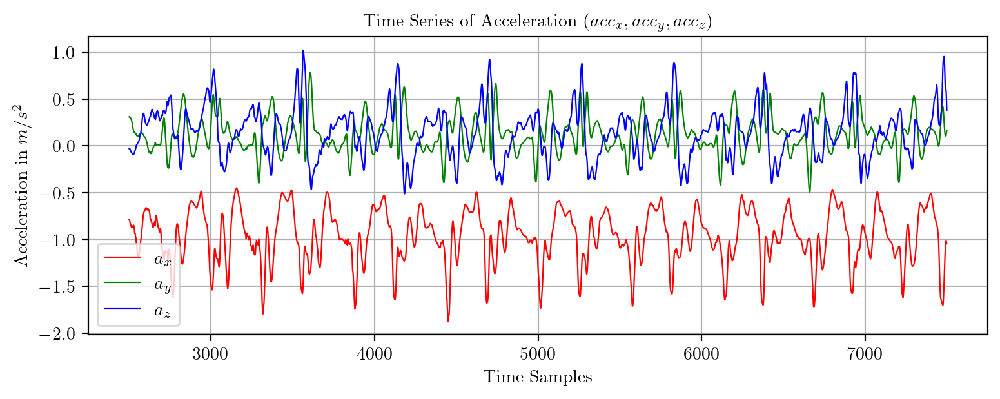

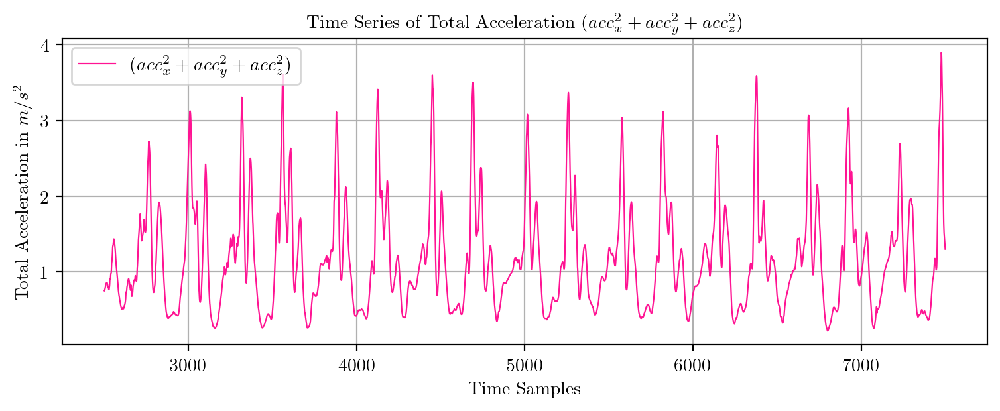

In [26]:
PlotTimeSeries(df.iloc[2500:7500,:], 1)
PlotTimeSeries(df.iloc[2500:7500,:], 0)

In [27]:
y_pred = model.predict(dfN1)
y_pred

array([2])

In [28]:
classesN

{1: 'WALKING',
 2: 'WALKING_UPSTAIRS',
 3: 'WALKING_DOWNSTAIRS',
 4: 'SITTING',
 5: 'STANDING',
 6: 'LAYING'}

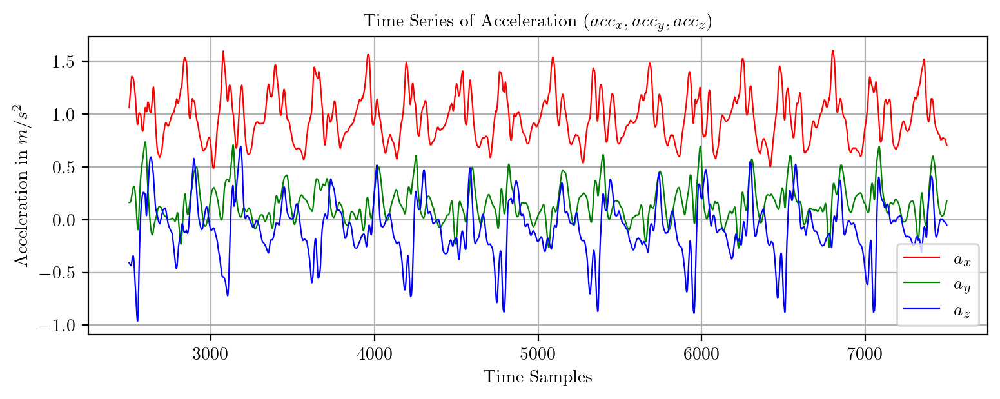

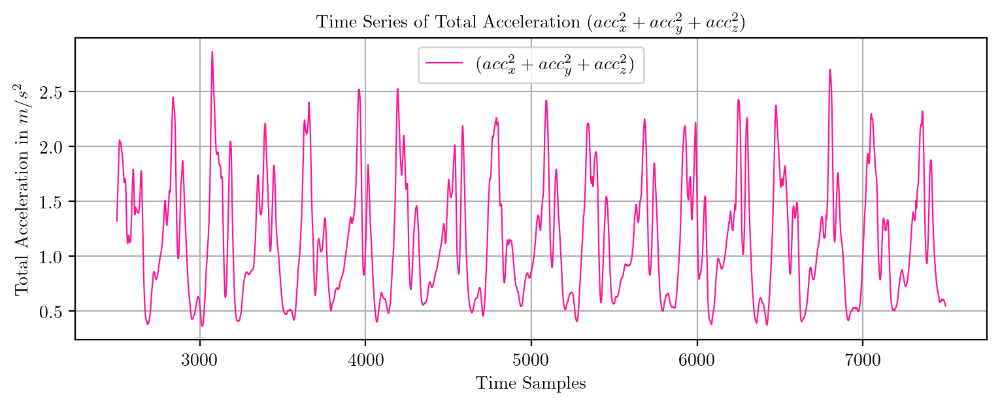

*** Feature extraction started ***



*** Feature extraction finished ***


'WALKING'

In [29]:
df1 = getTimeSeries('TS4Walking.csv')
DF = df1.iloc[2500:7500, :]
PlotTimeSeries(DF, 1)
PlotTimeSeries(DF, 0)
dfN2 = FeaturiserN(fetchTotTS(DF), features_sel)
y_pred = model.predict(dfN2)
classesN[y_pred[0]]

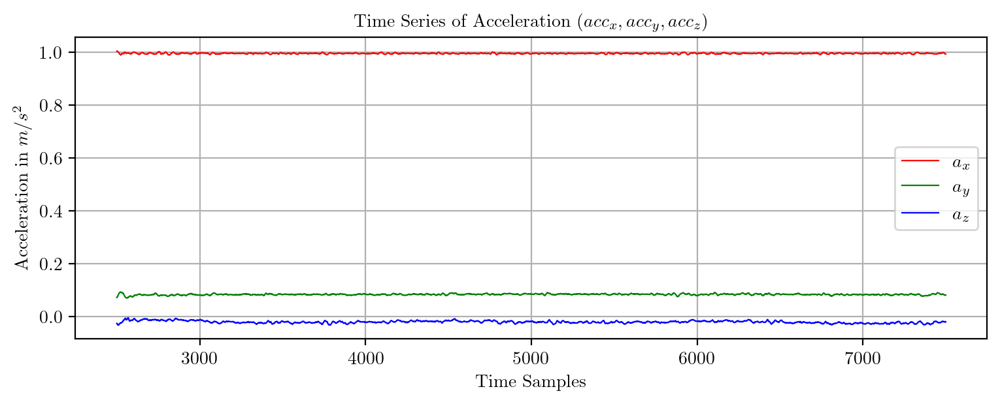

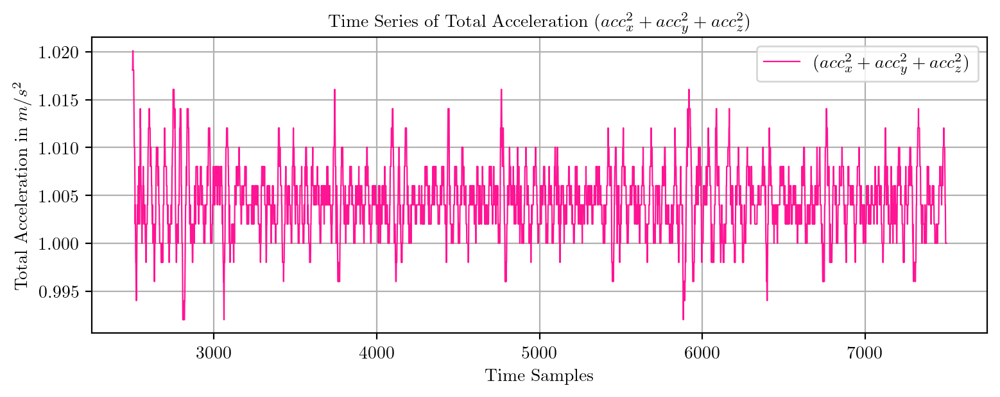

*** Feature extraction started ***



*** Feature extraction finished ***


'SITTING'

In [30]:
df2 = getTimeSeries('TS10Sitting.csv')
DF = df2.iloc[2500:7500, :]
PlotTimeSeries(DF, 1)
PlotTimeSeries(DF, 0)
dfN3 = FeaturiserN(fetchTotTS(DF), features_sel)
y_pred = model.predict(dfN3)
classesN[y_pred[0]]

In [31]:
# flag = 1 -> Only display the orginal untrimmed TS and trim-prediction on flag != 1
def PredictPlot(filename,  flag = 1, start = None, end = None):
    df = getTimeSeries(filename)
    if flag:
        print("Original Time Series")
        PlotTimeSeries(df, 1)
        PlotTimeSeries(df, 0)
    else:
        DF = df.iloc[start : end, :]
        print("Trimmed Time Series")
        PlotTimeSeries(DF, 1)
        PlotTimeSeries(DF, 0)
        dfN = FeaturiserN(fetchTotTS(DF), features_sel)
        y_pred = model.predict(dfN)
        print(classesN[y_pred[0]])

Trimmed Time Series


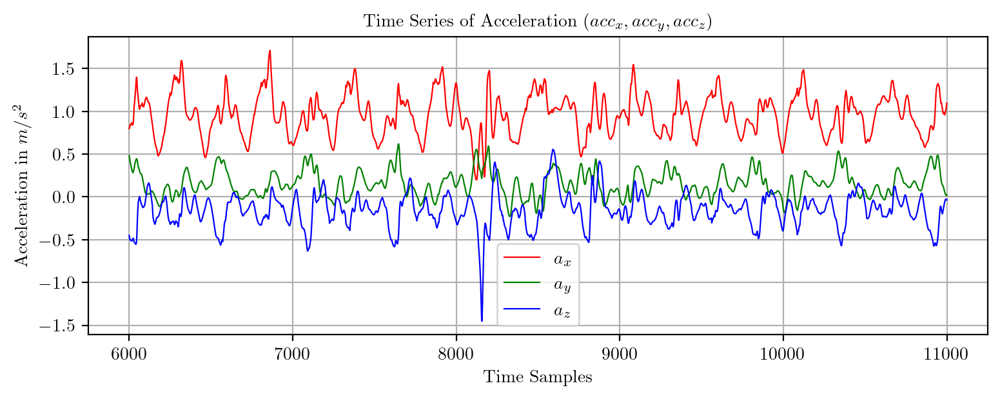

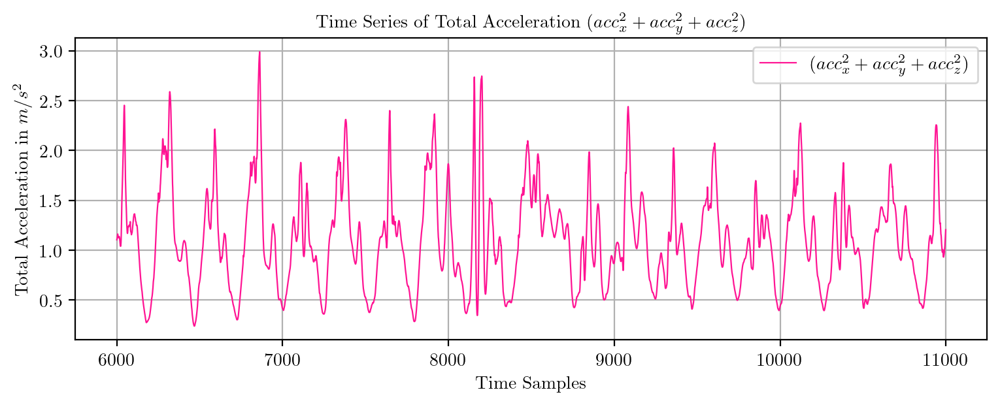

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_UPSTAIRS


In [33]:
PredictPlot("TS5WalkingUpstairs.csv", 0, 6000, 11000)

Trimmed Time Series


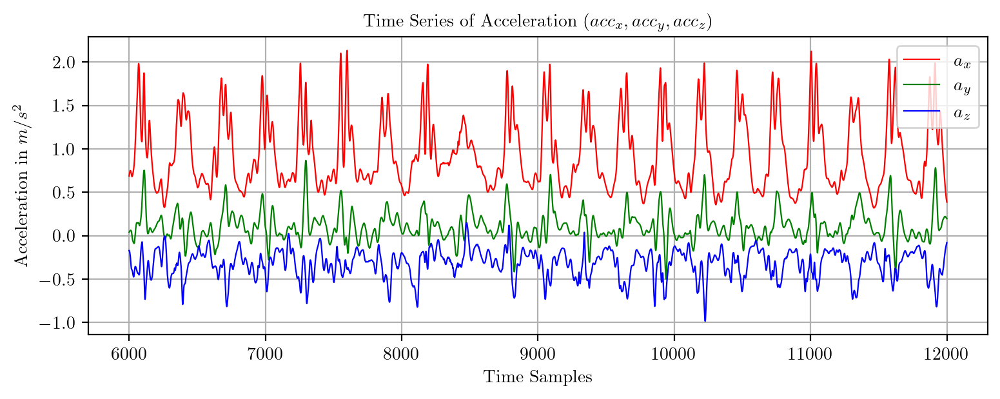

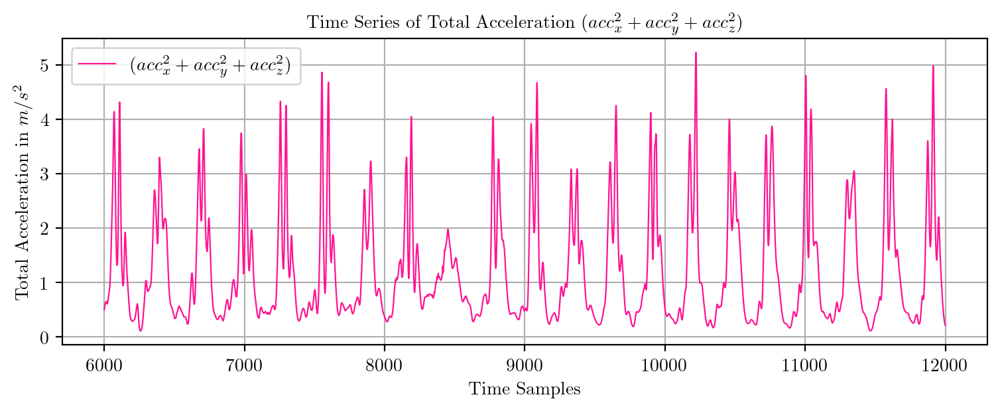

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_DOWNSTAIRS


In [35]:
PredictPlot("TS6WalkingDownstairs.csv", 0, 6000, 12000)

Trimmed Time Series


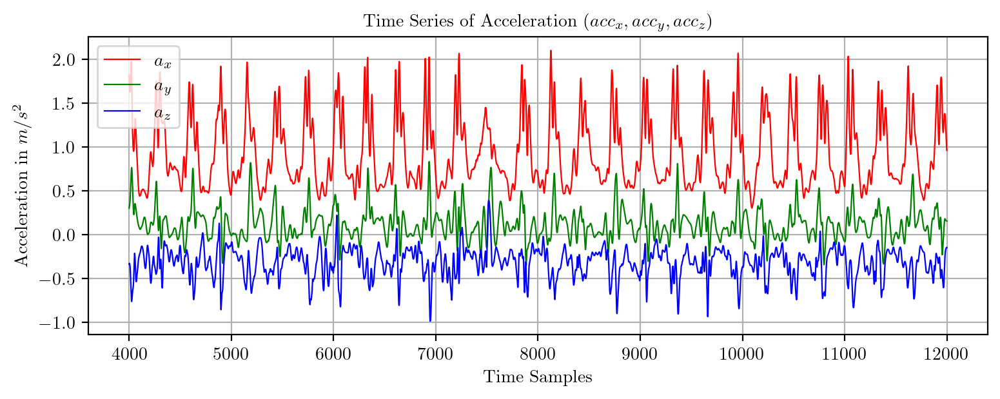

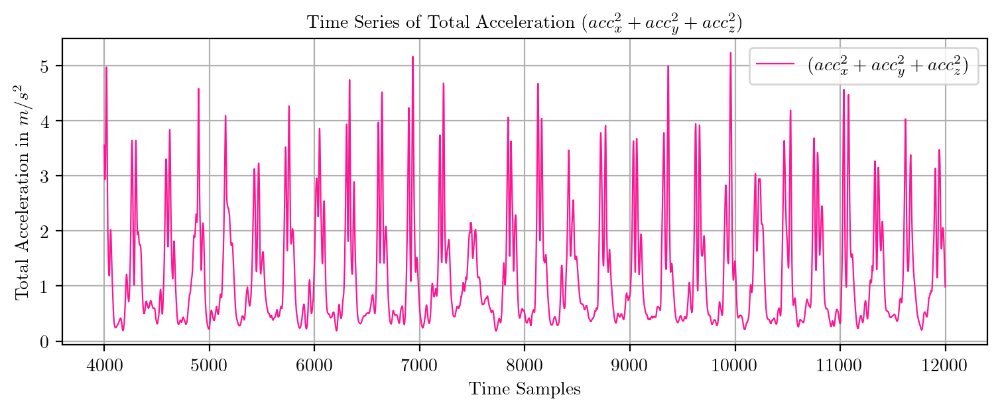

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_DOWNSTAIRS


In [37]:
PredictPlot("TS7WalkingDownstairs.csv", 0, 4000, 12000)

Trimmed Time Series


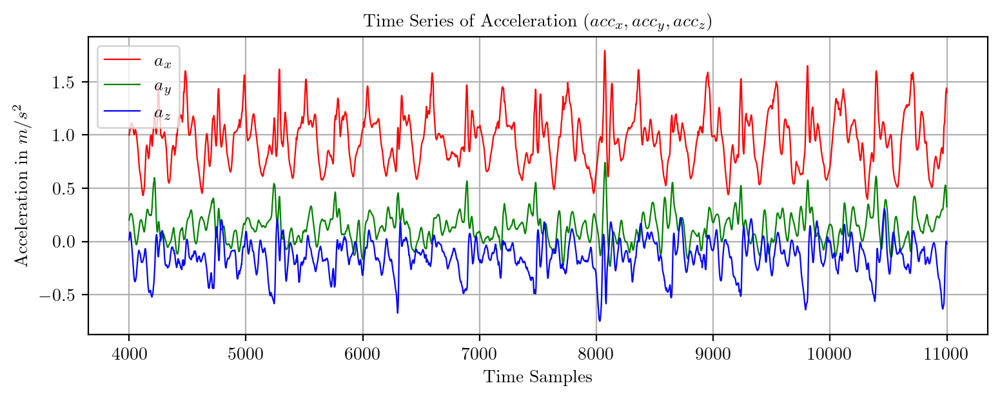

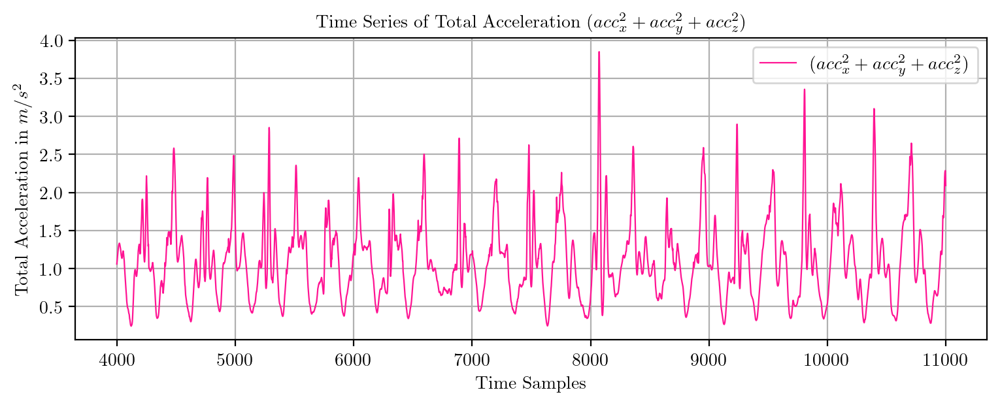

*** Feature extraction started ***



*** Feature extraction finished ***
STANDING


In [39]:
PredictPlot("TS8WalkingUpstairs.csv", 0, 4000, 11000)

Trimmed Time Series


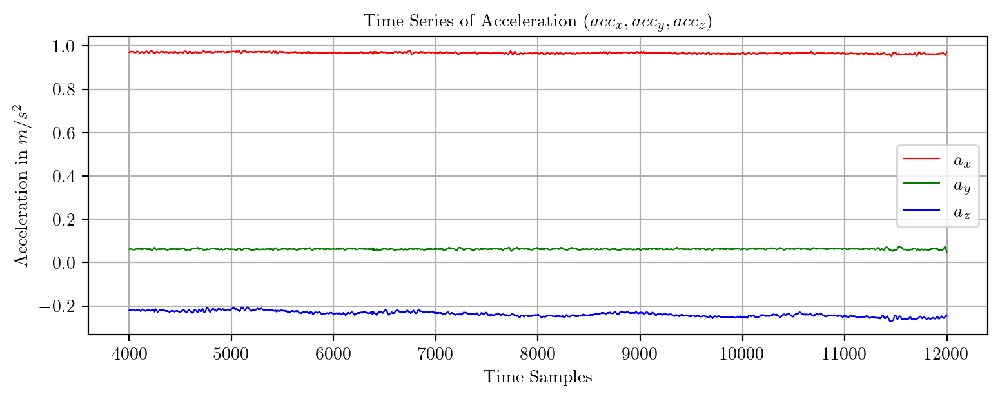

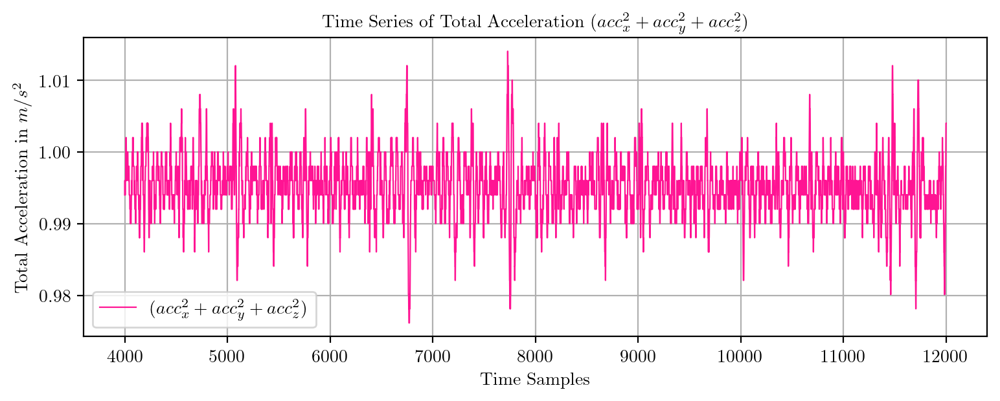

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [49]:
PredictPlot("TS9Sitting.csv", 0, 4000, 12000)

Trimmed Time Series


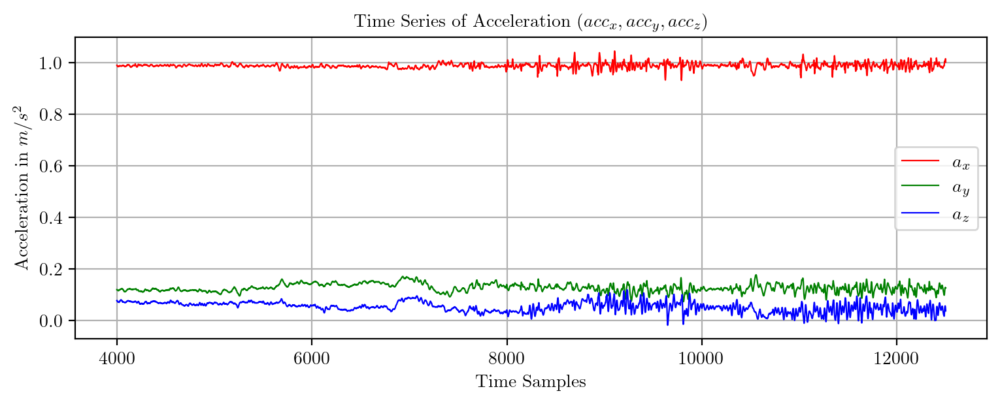

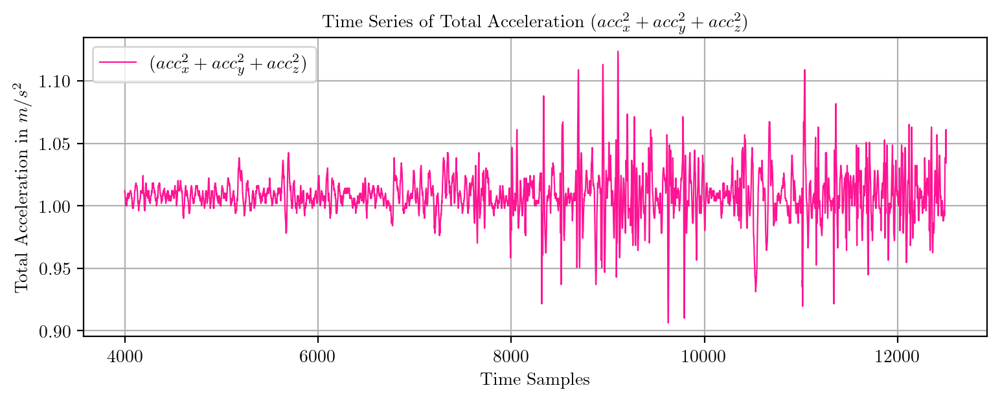

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [42]:
PredictPlot("TS11Standing.csv", 0, 4000, 12500)

Trimmed Time Series


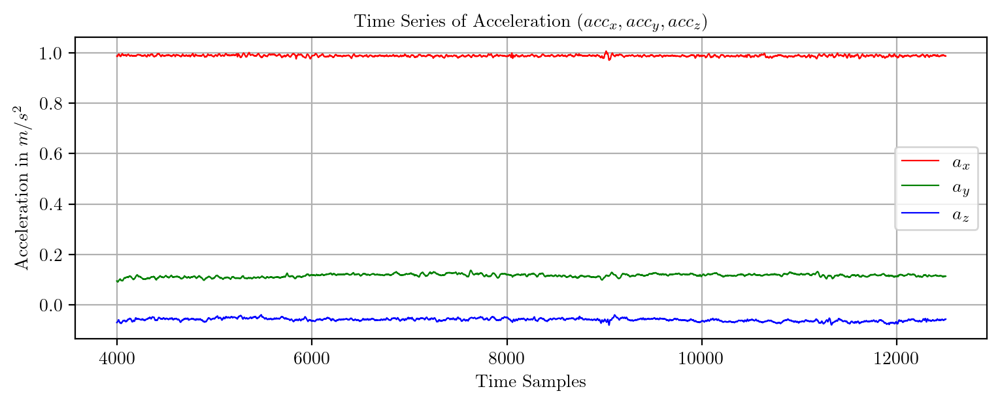

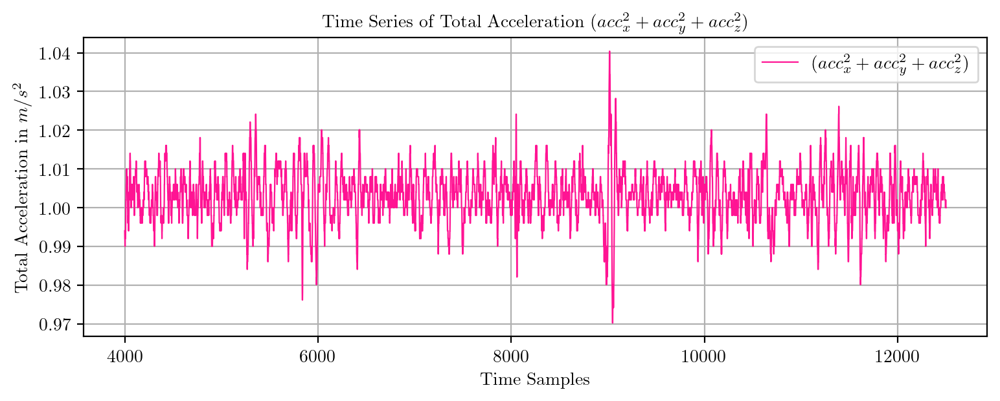

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [44]:
PredictPlot("TS12Standing.csv", 0, 4000, 12500)

Original Time Series


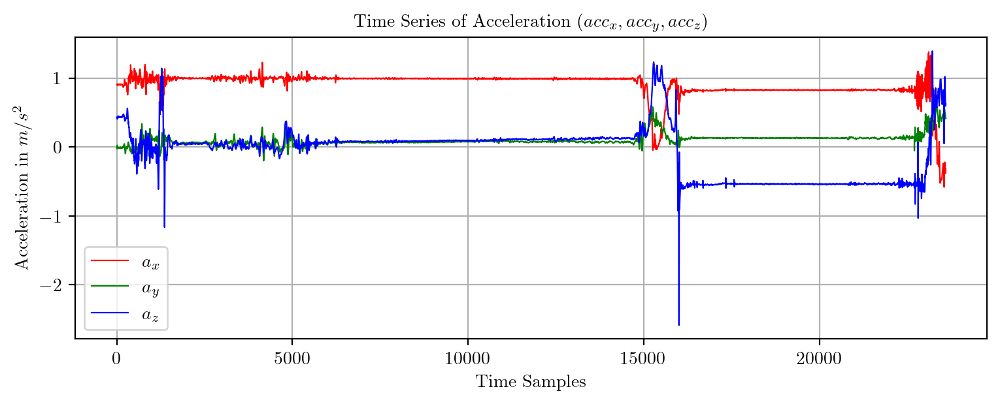

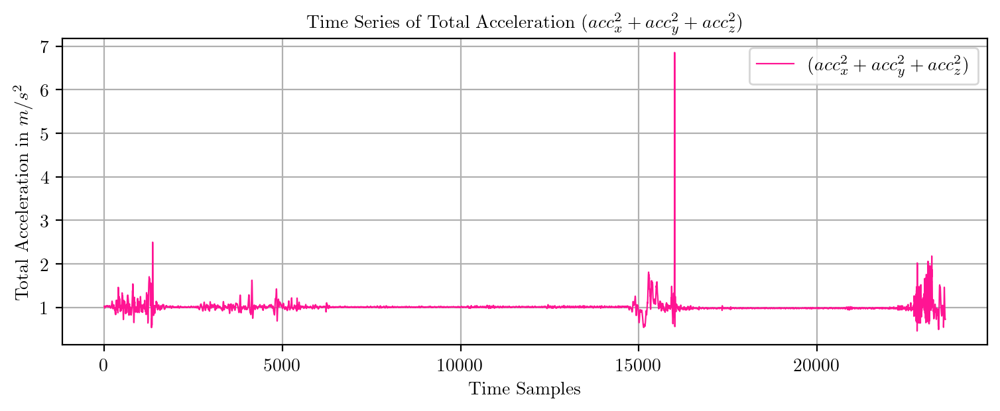

In [45]:
PredictPlot("TS13SittingStanding.csv", 1)

Trimmed Time Series


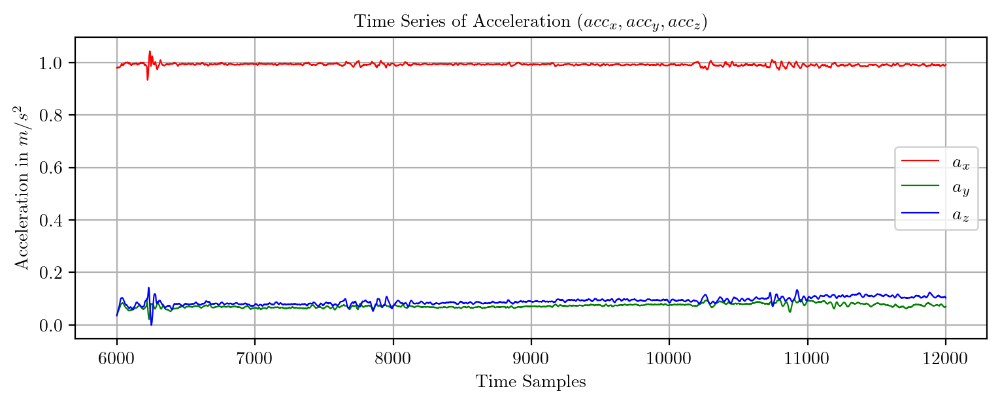

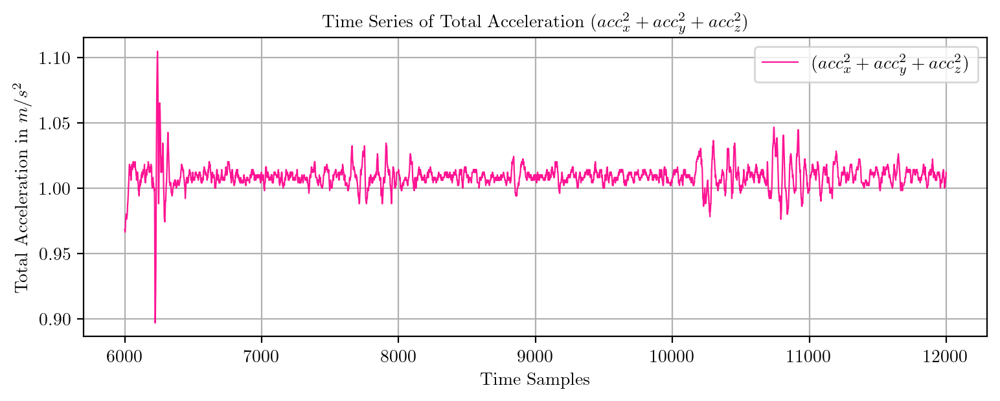

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [46]:
PredictPlot("TS13SittingStanding.csv", 0, 6000, 12000)

Trimmed Time Series


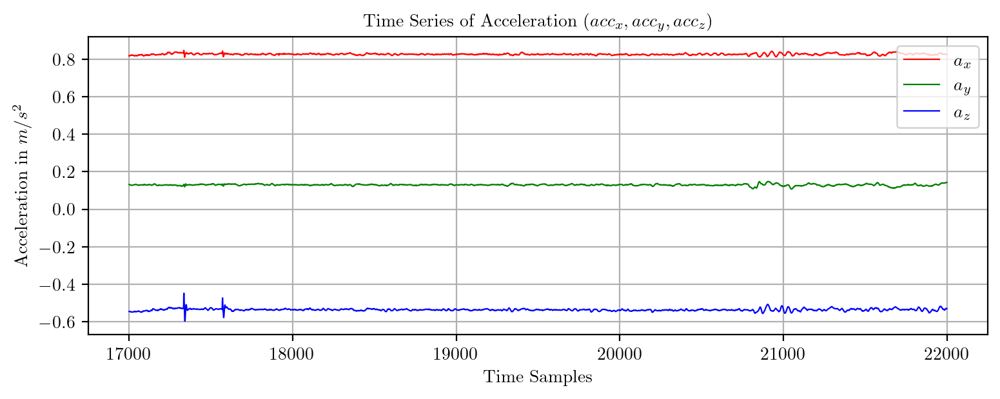

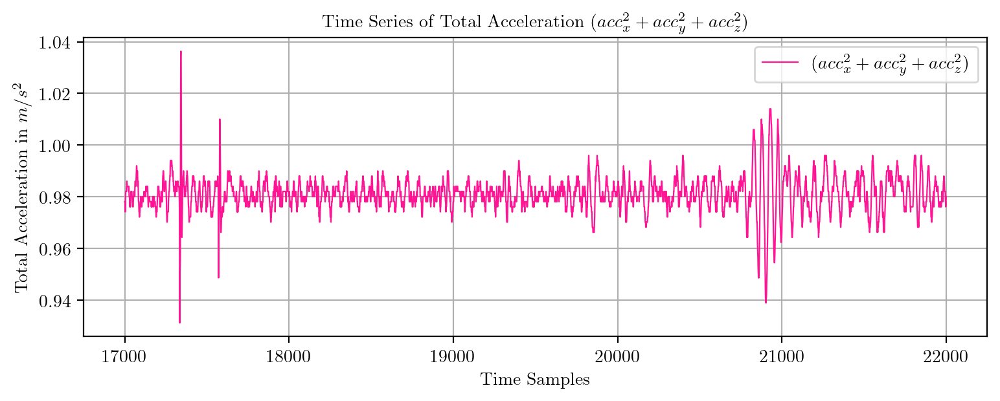

*** Feature extraction started ***



*** Feature extraction finished ***
LAYING


In [47]:
PredictPlot("TS13SittingStanding.csv", 0, 17000, 22000)

Trimmed Time Series


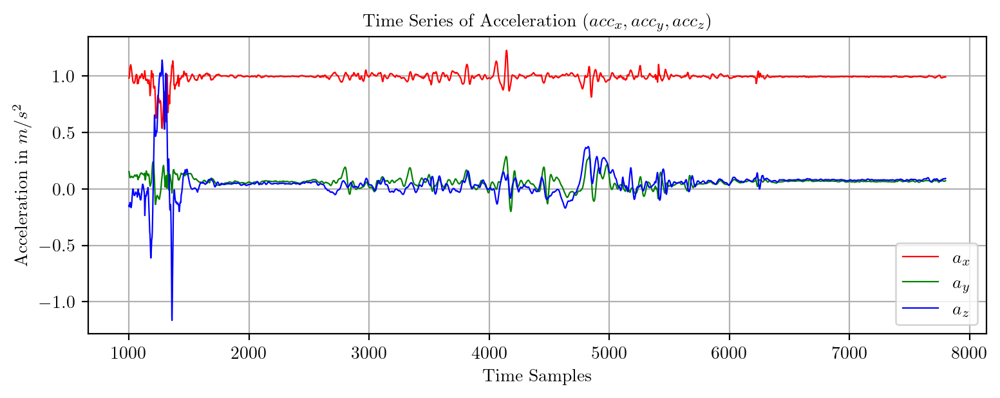

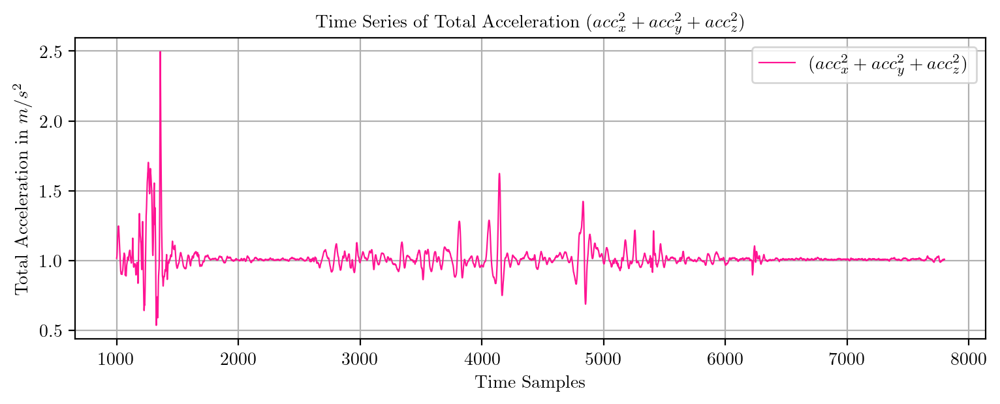

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING


In [61]:
PredictPlot("TS13SittingStanding.csv", 0, 1000, 7800)

Trimmed Time Series


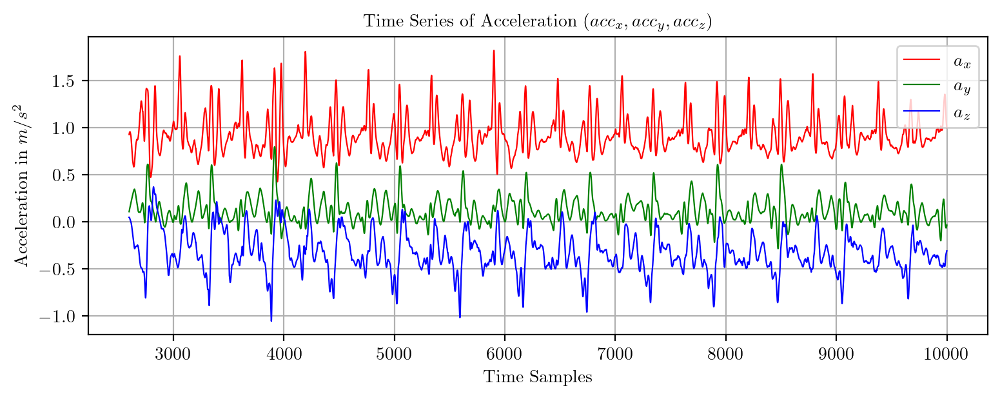

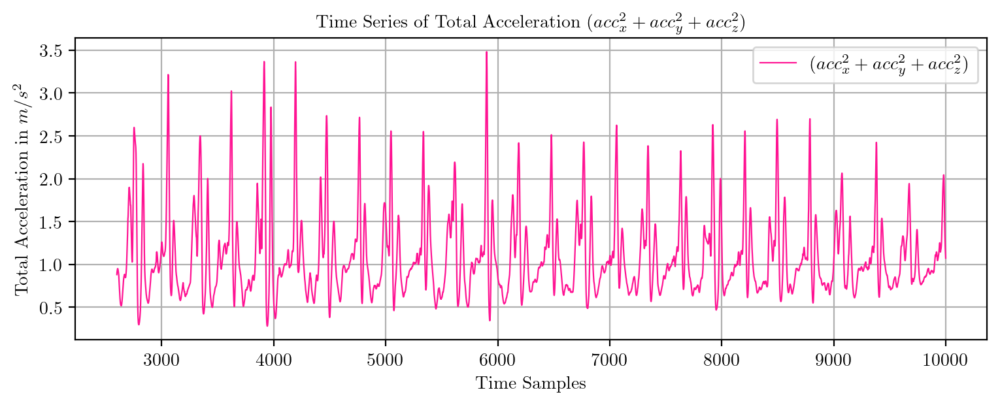

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING


In [50]:
PredictPlot("TS15Walking.csv", 0, 2600, 10000)

Trimmed Time Series


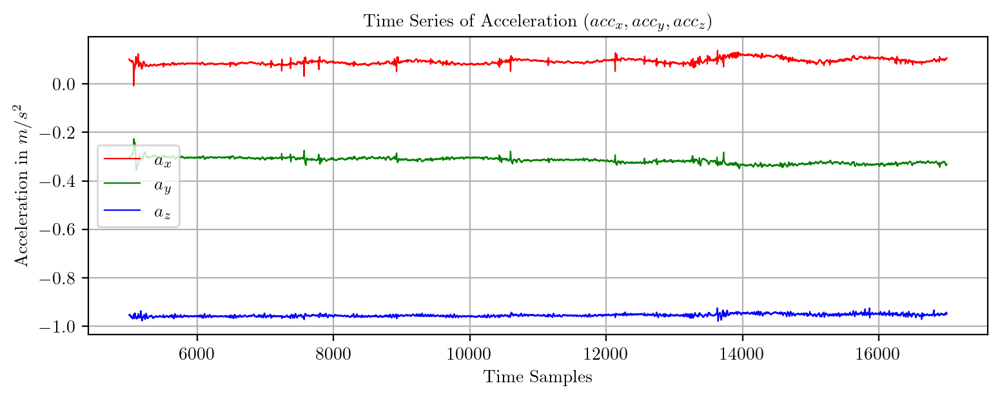

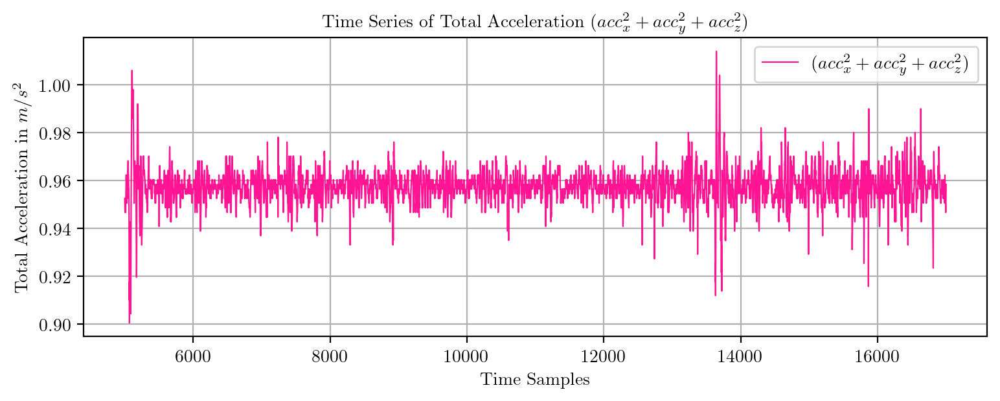

*** Feature extraction started ***



*** Feature extraction finished ***
LAYING


In [52]:
PredictPlot("TS16Laying.csv", 0, 5000, 17000)

In [53]:
classesN

{1: 'WALKING',
 2: 'WALKING_UPSTAIRS',
 3: 'WALKING_DOWNSTAIRS',
 4: 'SITTING',
 5: 'STANDING',
 6: 'LAYING'}

In [122]:
## flag = 1 for a single plot and 0 for subplots for 2 - 8 depths
def confMatrix(dataFrame, flag = 1, accuracies = None):
    if flag:
        plt.figure(figsize = (6, 6))
        ax = sns.heatmap(dataFrame, annot = True, cmap = "PuBu")
        plt.setp(ax.get_xticklabels(), rotation = 45, fontsize = 8)
        plt.setp(ax.get_yticklabels(), fontsize = 8)
        plt.ylabel("True label", fontsize = 18)
        plt.xlabel("Predicted label", fontsize = 18)
        plt.title(f"Accuracy = {accuracy_score(y, y_pred)*100: .4f}%", fontweight = "bold", fontsize = 13)
        plt.show()
    else:
        fig, axes = plt.subplots(3, 3, figsize = (25, 25))
        axes = axes.flatten()

        for i, df in enumerate(dataFrame):
            ax = sns.heatmap(df, annot = True, ax = axes[i], cbar = False, cmap = "PuBu")
            
            plt.setp(ax.get_xticklabels(), rotation = 45, fontsize = 6)
            plt.setp(ax.get_yticklabels(), fontsize = 8)
            ax.set_title(f"Depth = {i + 2}\nAccuracy = {accuracies[i] * 100: .4f}%", fontsize = 10)
            ax.set_ylabel("True label", fontsize = 12)
            ax.set_xlabel("Predicted label", fontsize = 12)
            
        plt.delaxes(axes[7])
        plt.delaxes(axes[8])
        plt.tight_layout()
        plt.subplots_adjust(wspace = 1.1, hspace = 1.1)
        plt.show()

Trimmed Time Series


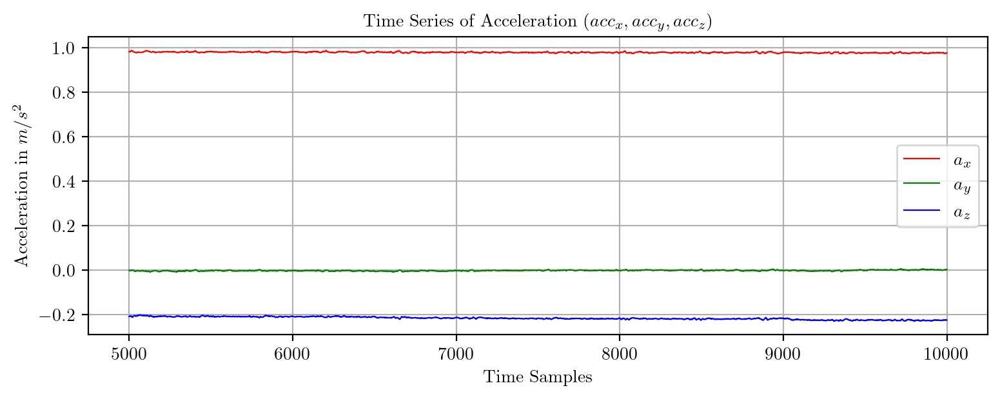

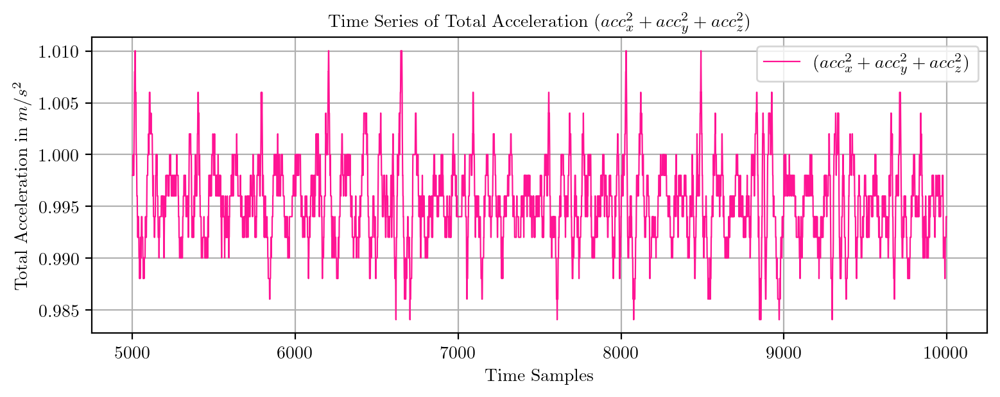

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [61]:
PredictPlot("TS17Sitting.csv", 0, 5000, 10000)

Trimmed Time Series


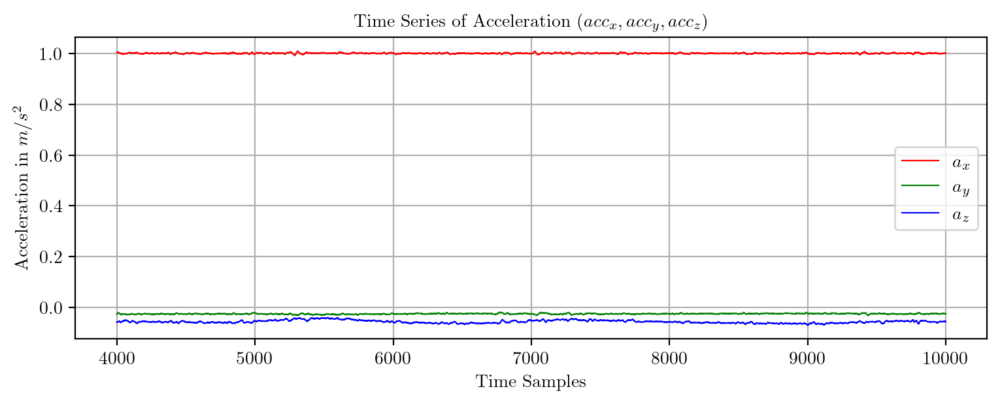

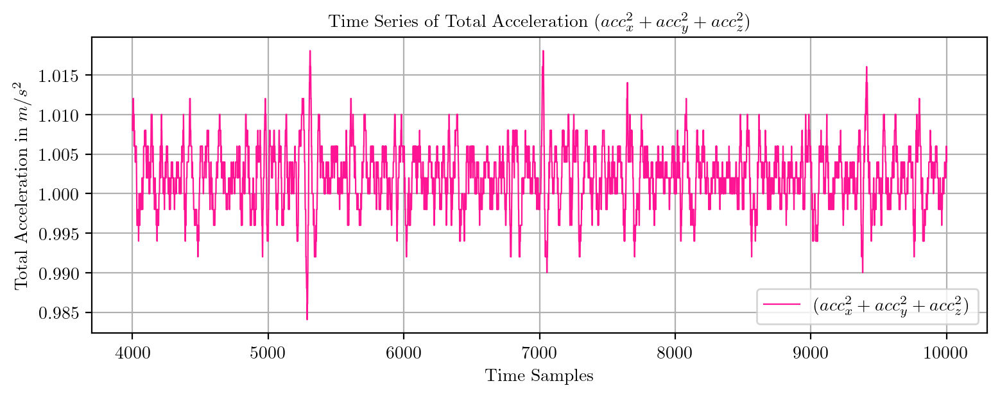

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [63]:
PredictPlot("TS18Sitting.csv", 0, 4000, 10000)

Trimmed Time Series


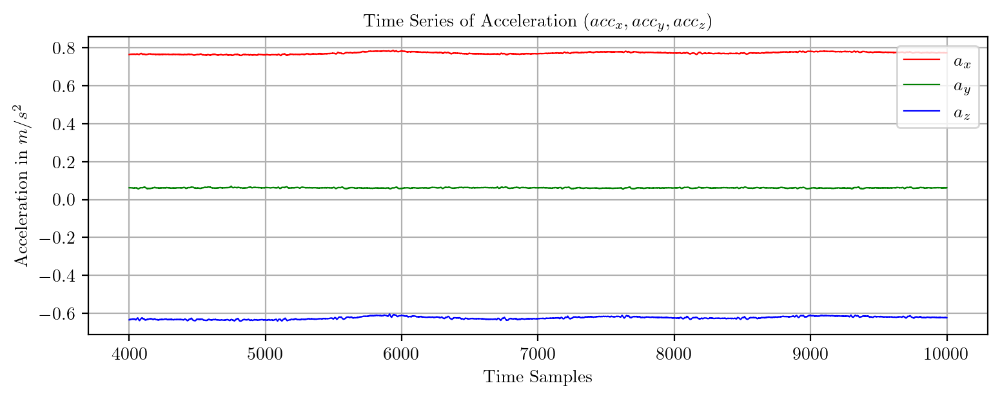

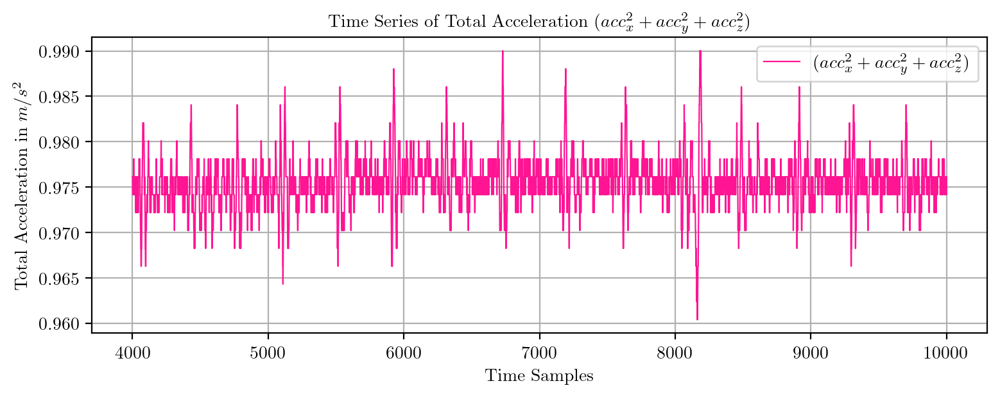

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [65]:
PredictPlot("TS19Sitting.csv", 0, 4000, 10000)

Trimmed Time Series


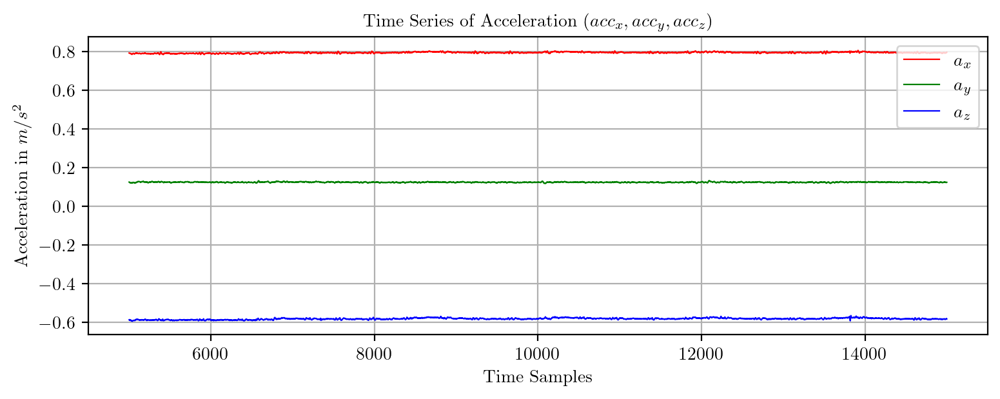

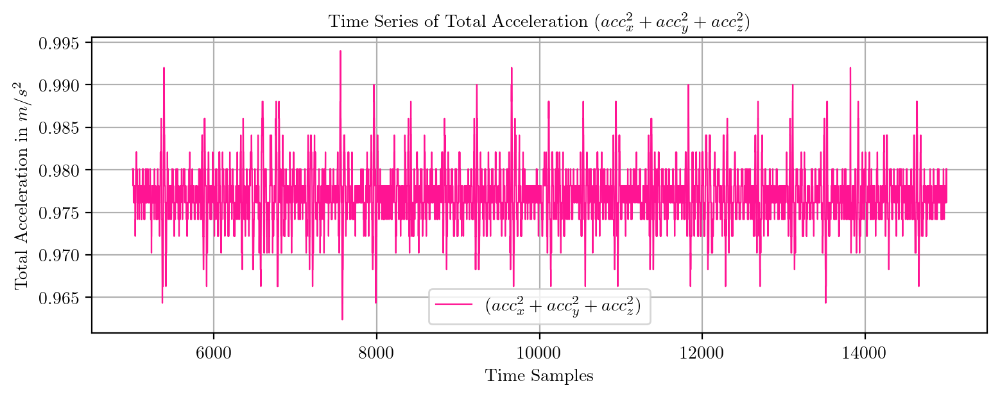

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [68]:
PredictPlot("TS21Sitting.csv", 0, 5000, 15000)

Trimmed Time Series


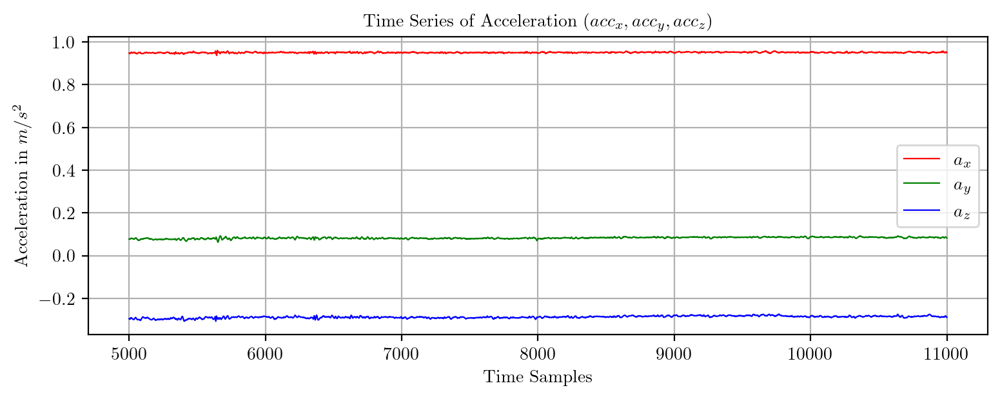

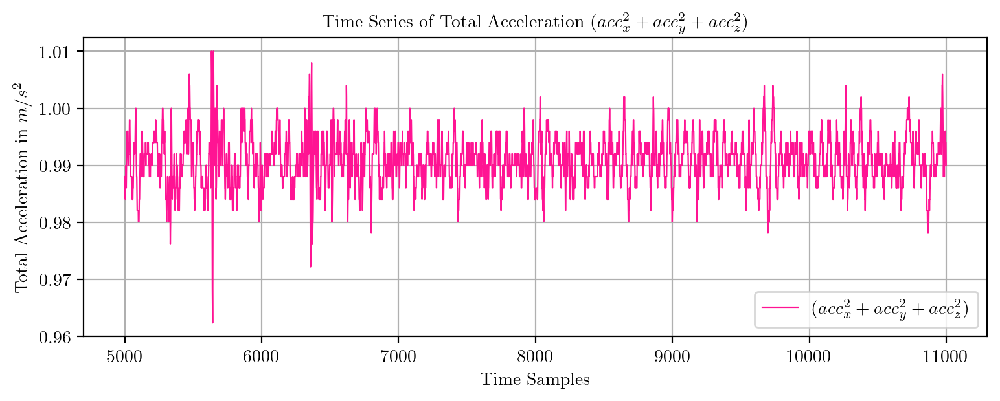

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [70]:
PredictPlot("TS22Standing.csv", 0, 5000, 11000)

Trimmed Time Series


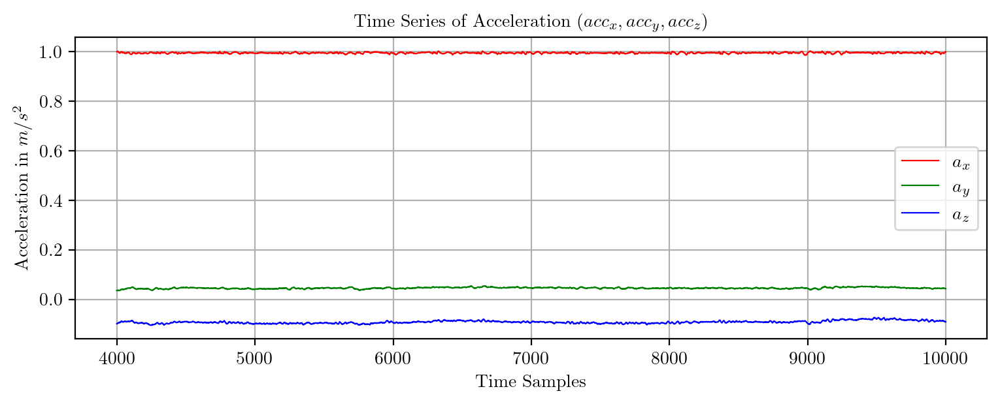

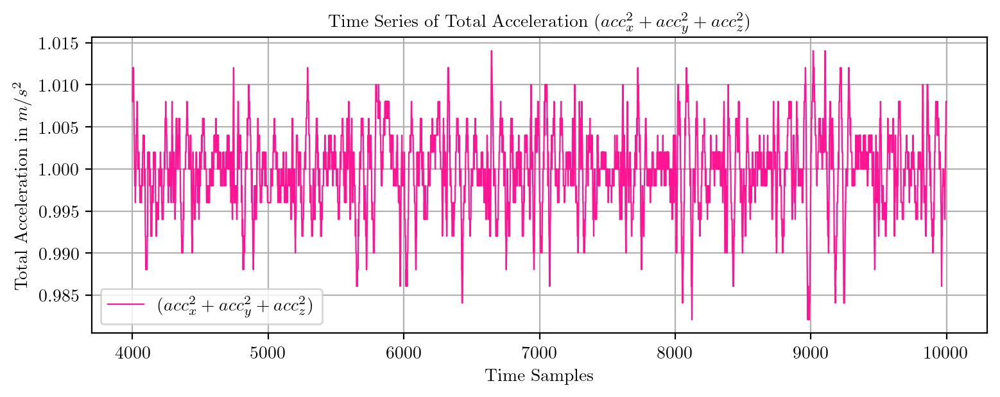

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [72]:
PredictPlot("TS23Standing.csv", 0, 4000, 10000)

Trimmed Time Series


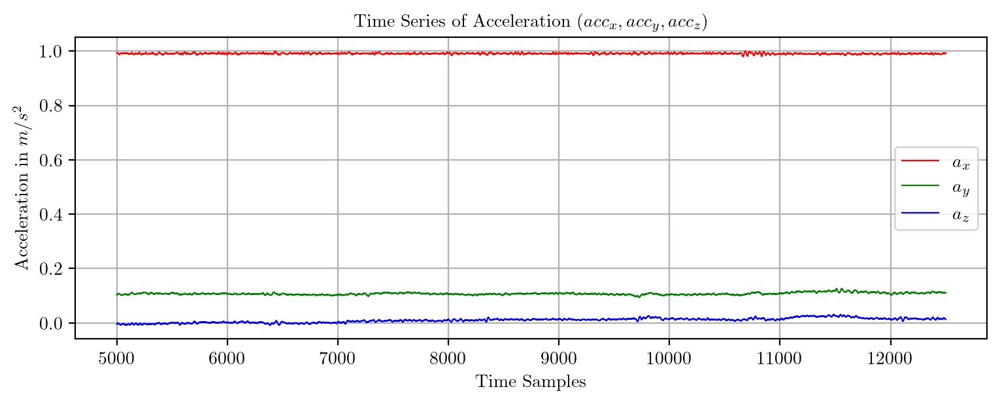

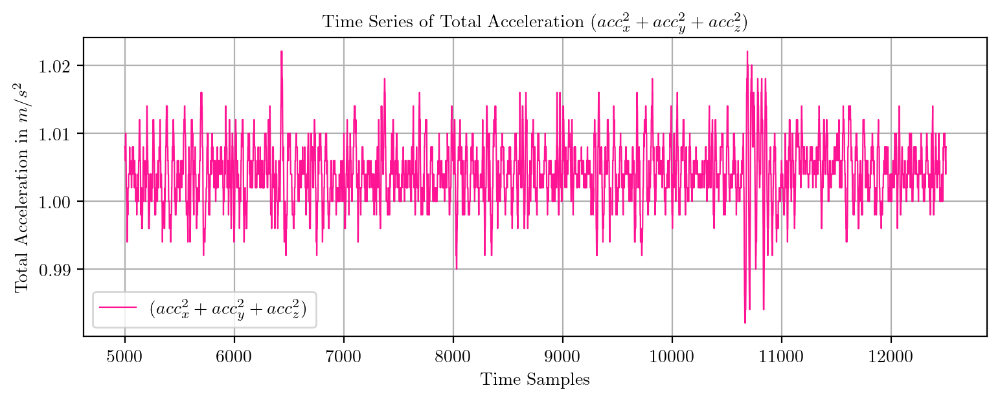

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [74]:
PredictPlot("TS24Standing.csv", 0, 5000, 12500)

Trimmed Time Series


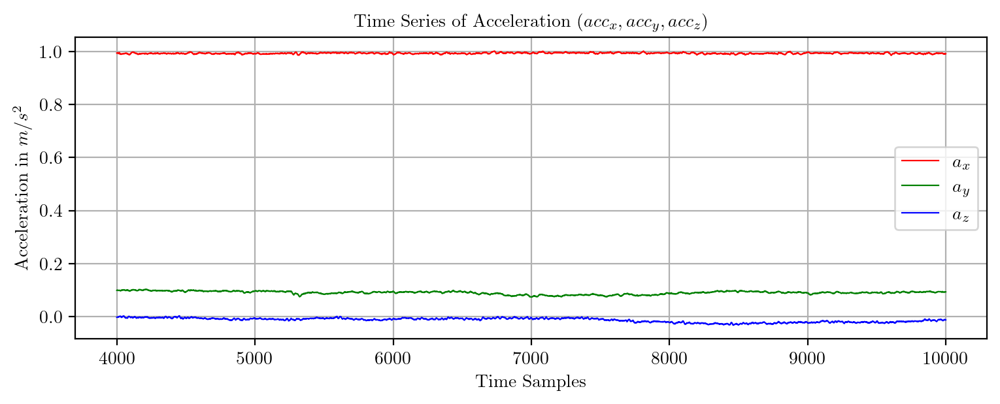

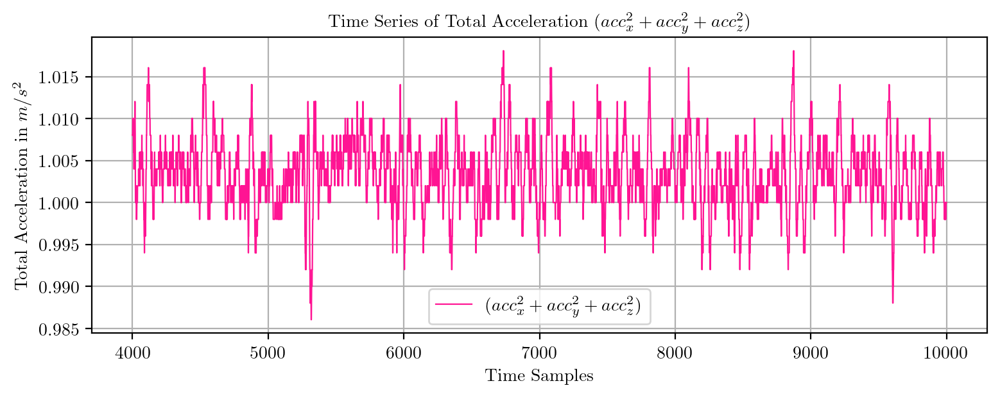

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [76]:
PredictPlot("TS25Standing.csv", 0, 4000, 10000)

Trimmed Time Series


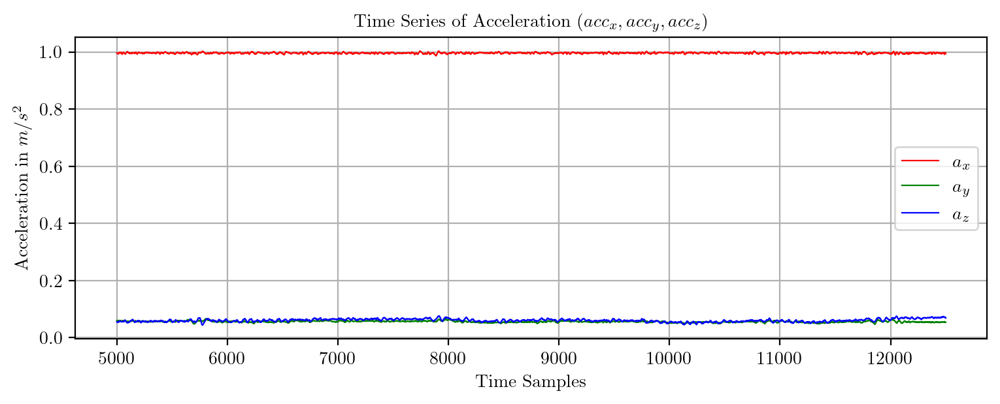

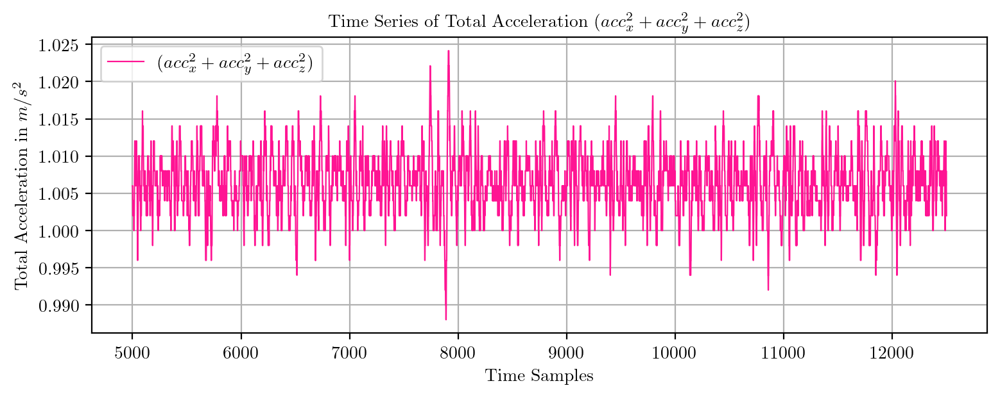

*** Feature extraction started ***



*** Feature extraction finished ***
SITTING


In [78]:
PredictPlot("TS26Standing.csv", 0, 5000, 12500)

Trimmed Time Series


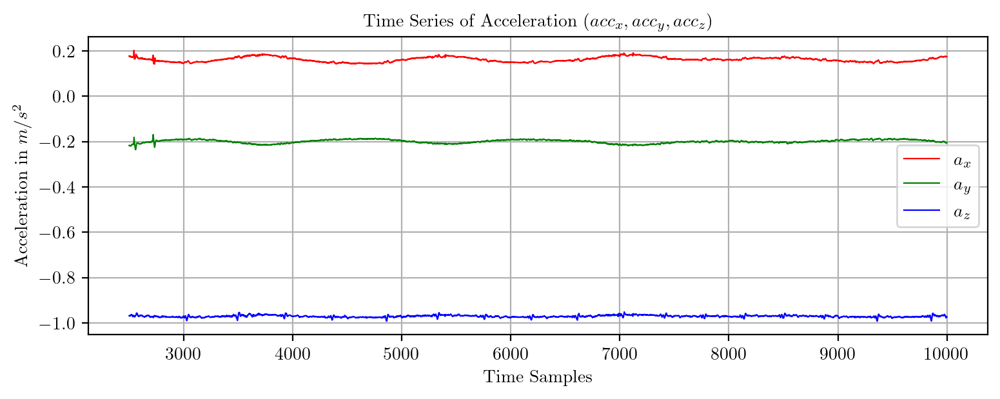

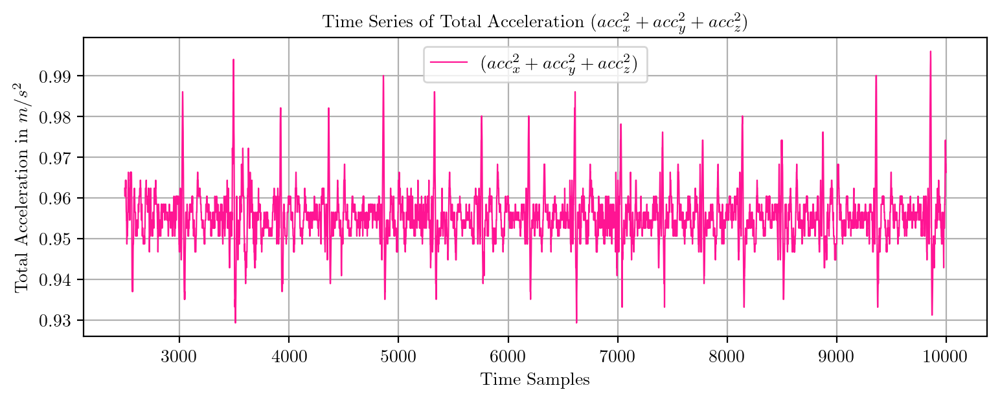

*** Feature extraction started ***



*** Feature extraction finished ***
LAYING


In [80]:
PredictPlot("TS27Laying.csv", 0, 2500, 10000)

Trimmed Time Series


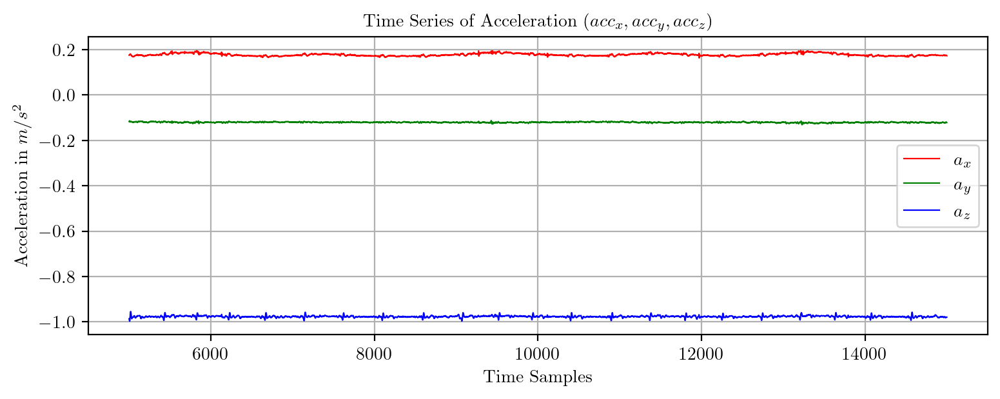

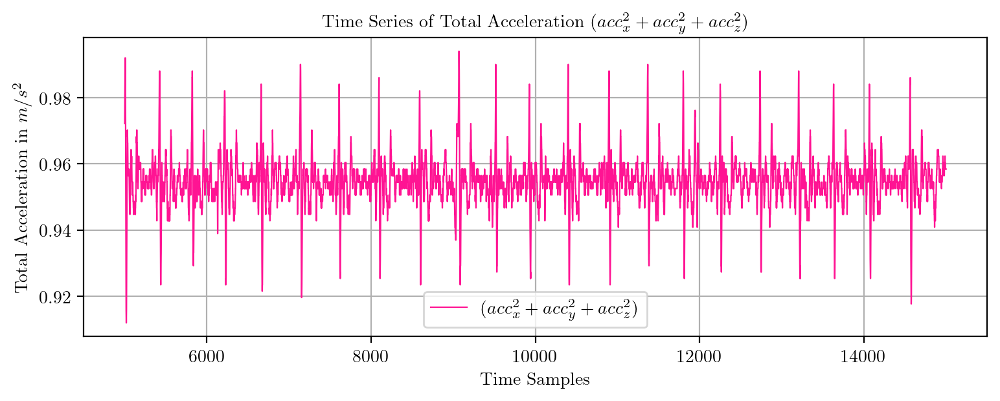

*** Feature extraction started ***



*** Feature extraction finished ***
LAYING


In [82]:
PredictPlot("TS28Laying.csv", 0, 5000, 15000)

Trimmed Time Series


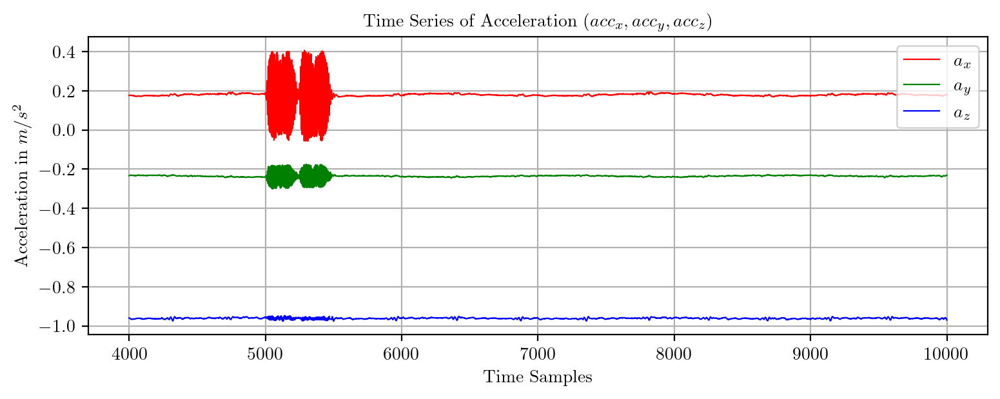

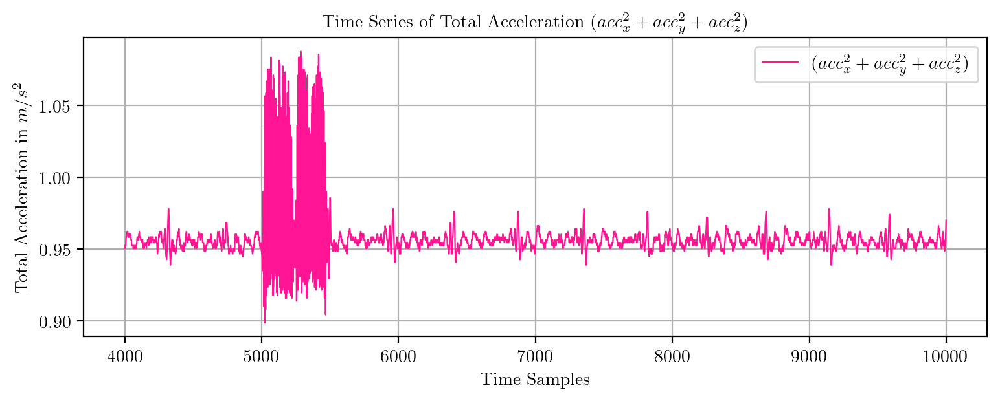

*** Feature extraction started ***



*** Feature extraction finished ***
LAYING


In [84]:
PredictPlot("TS29Laying.csv", 0, 4000, 10000)

Trimmed Time Series


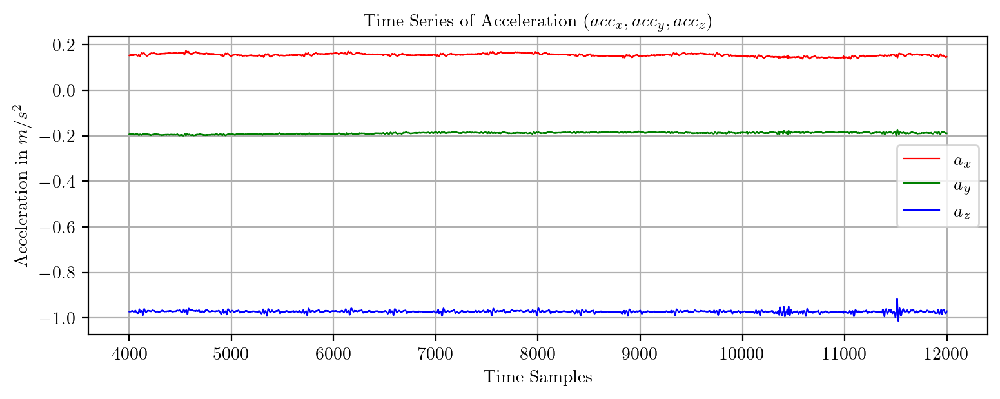

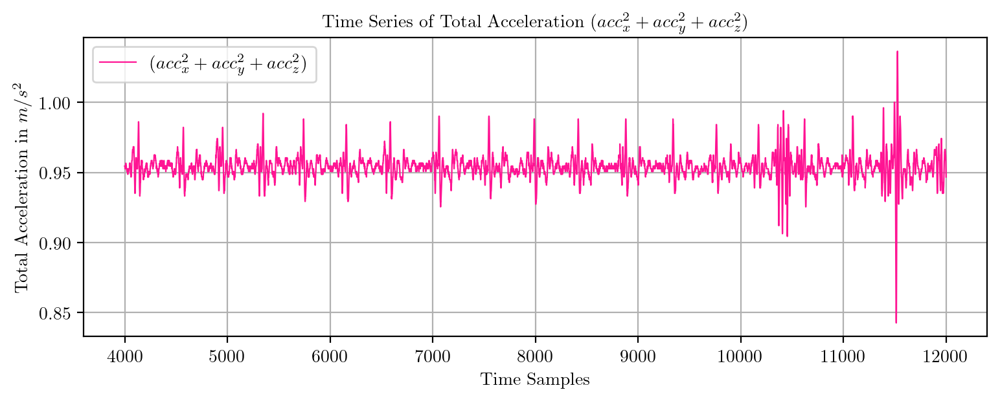

*** Feature extraction started ***



*** Feature extraction finished ***
LAYING


In [86]:
PredictPlot("TS30Laying.csv", 0, 4000, 12000)

Trimmed Time Series


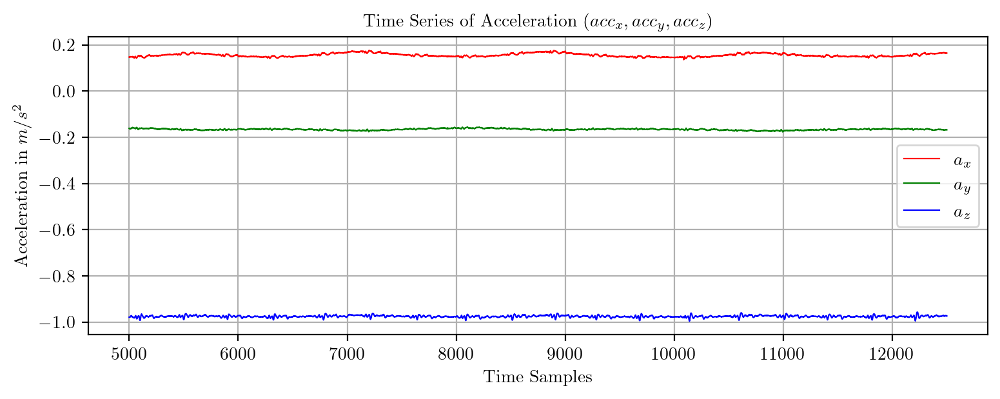

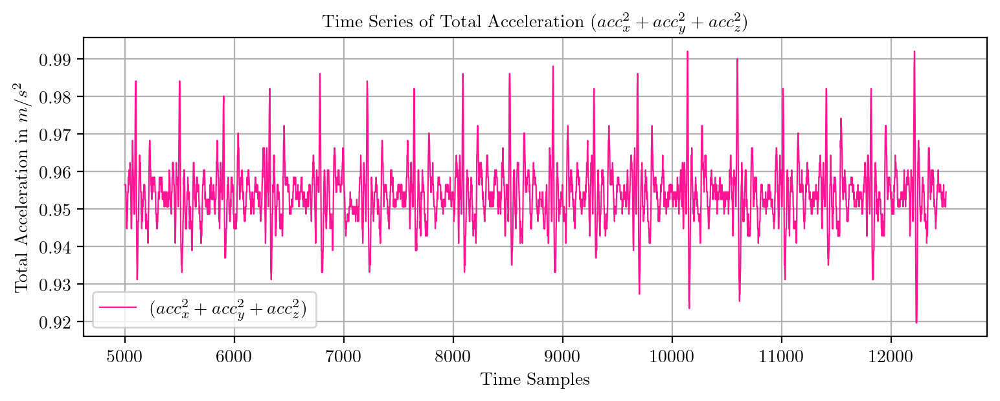

*** Feature extraction started ***



*** Feature extraction finished ***
LAYING


In [88]:
PredictPlot("TS31Laying.csv", 0, 5000, 12500)

Trimmed Time Series


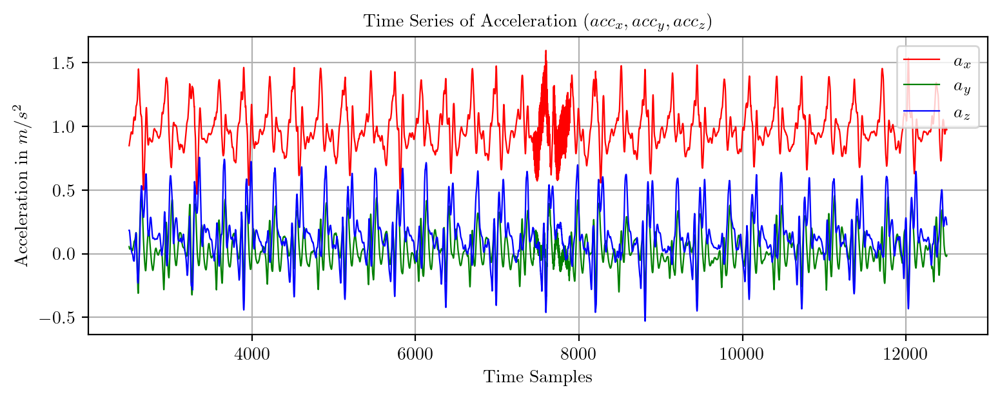

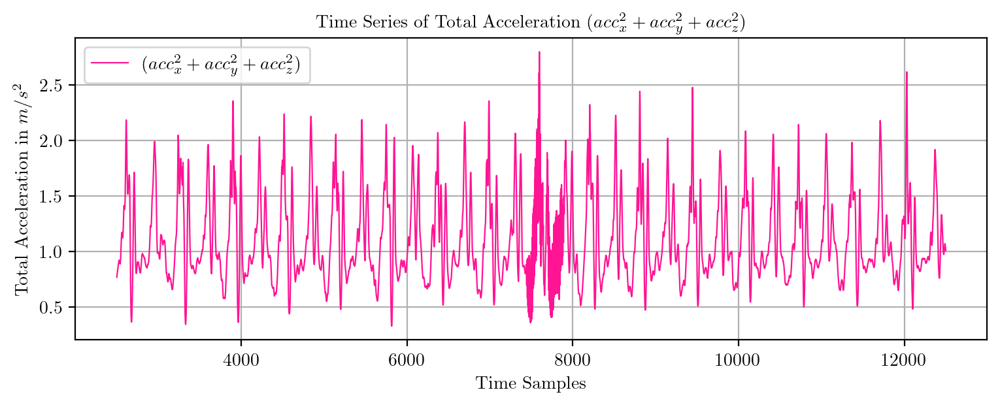

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING


In [90]:
PredictPlot("TS32Walking.csv", 0, 2500, 12500)

Trimmed Time Series


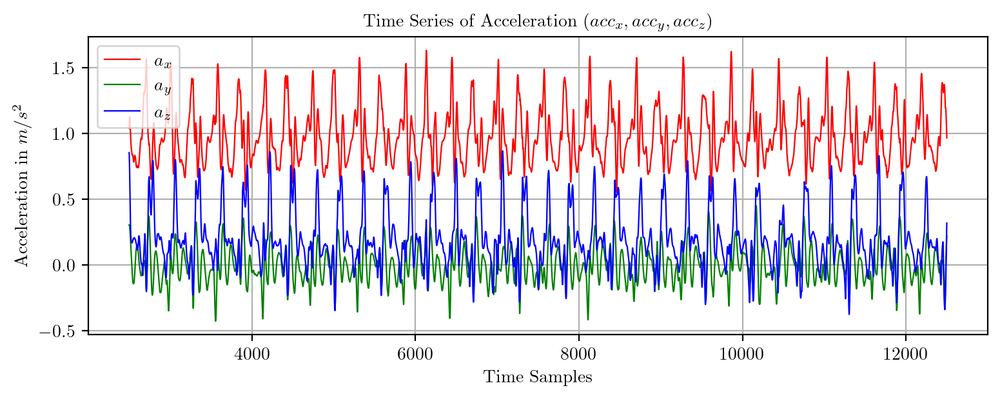

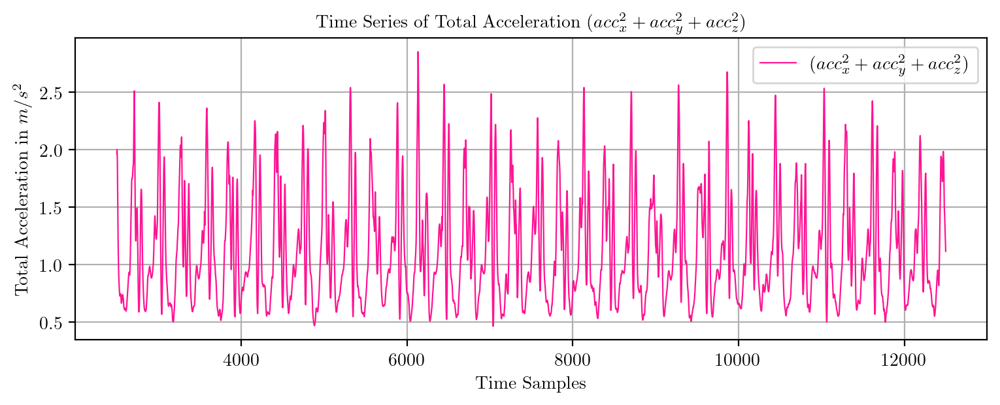

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING


In [92]:
PredictPlot("TS33Walking.csv", 0, 2500, 12500)

Trimmed Time Series


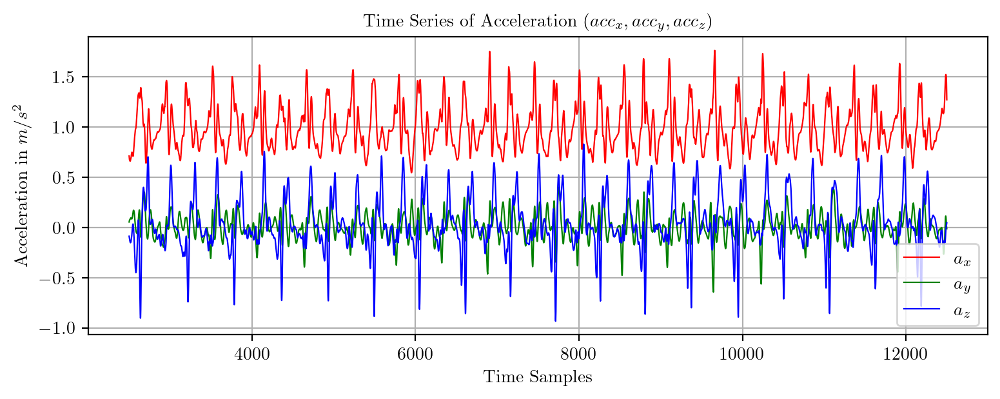

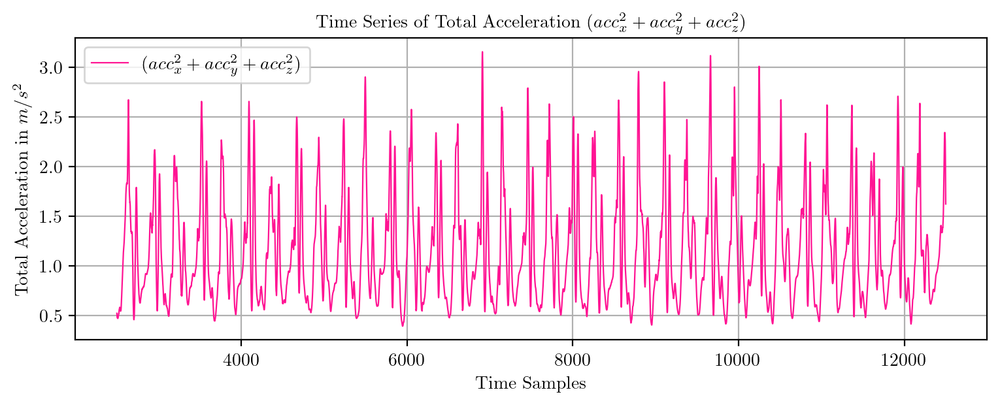

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING


In [94]:
PredictPlot("TS34Walking.csv", 0, 2500, 12500)

Trimmed Time Series


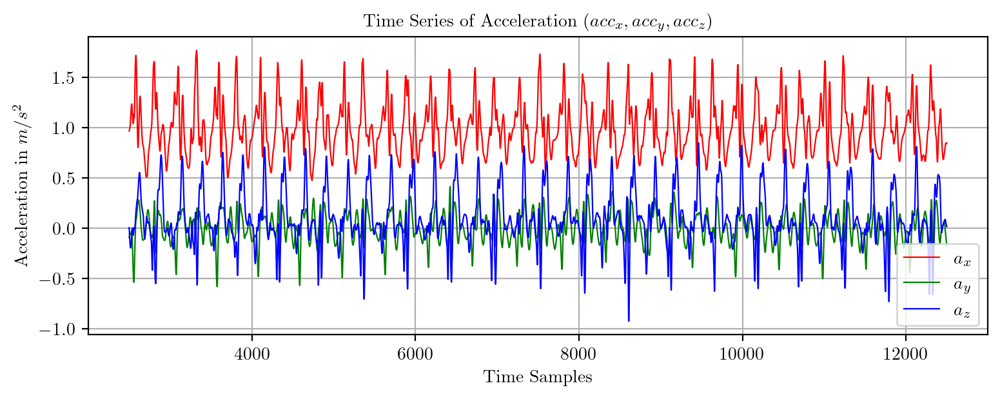

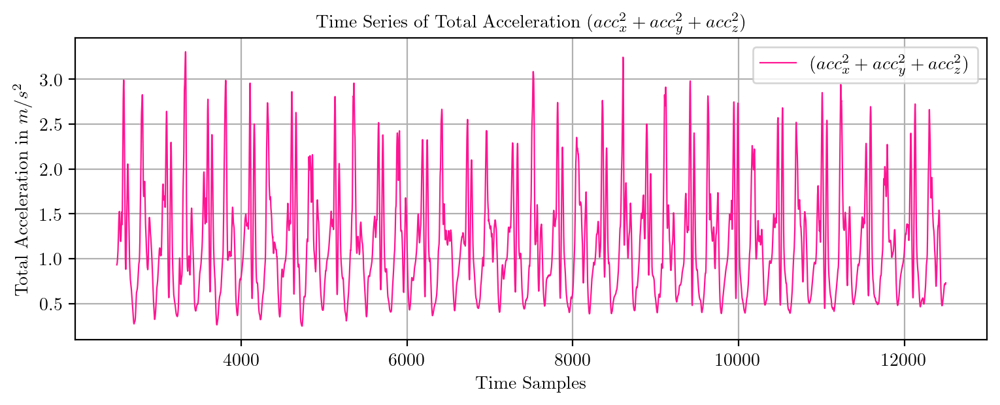

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_UPSTAIRS


In [96]:
PredictPlot("TS35Walking.csv", 0, 2500, 12500)

Trimmed Time Series


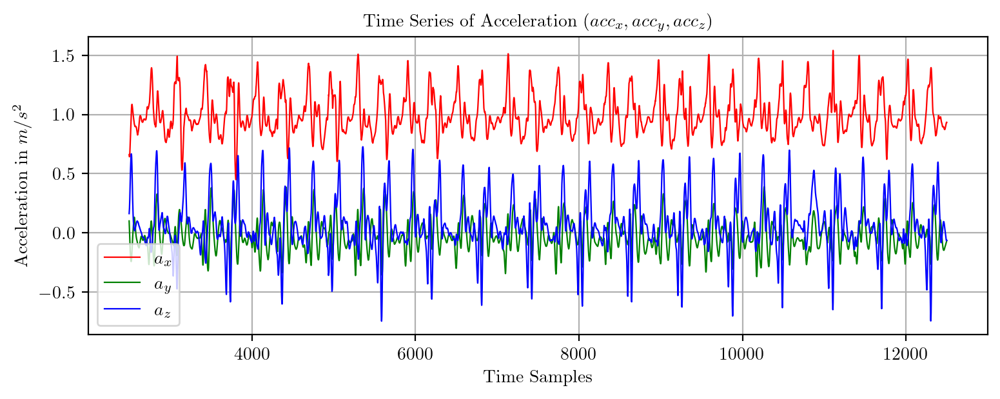

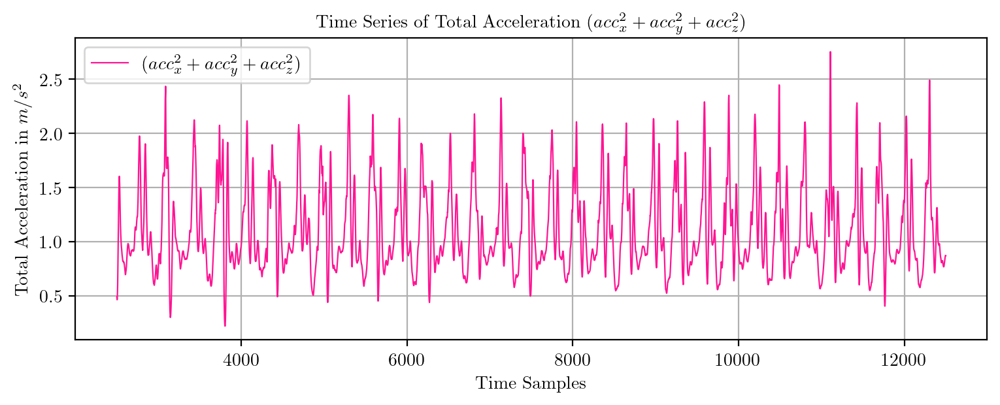

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING


In [98]:
PredictPlot("TS36Walking.csv", 0, 2500, 12500)

Trimmed Time Series


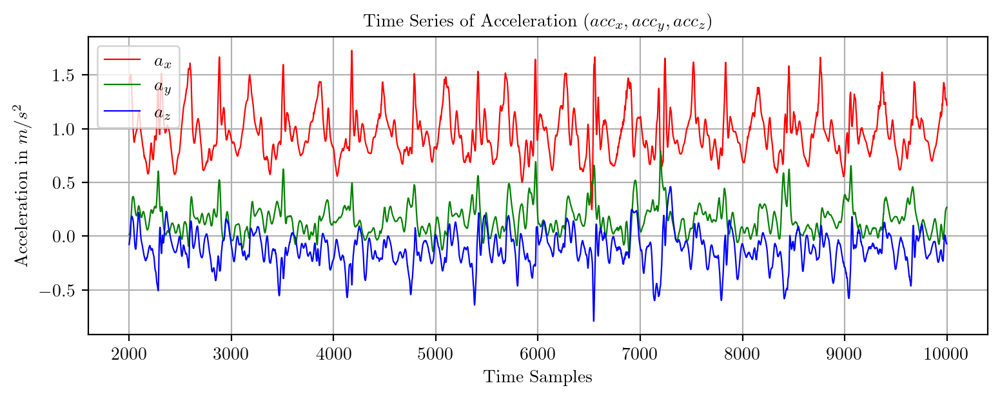

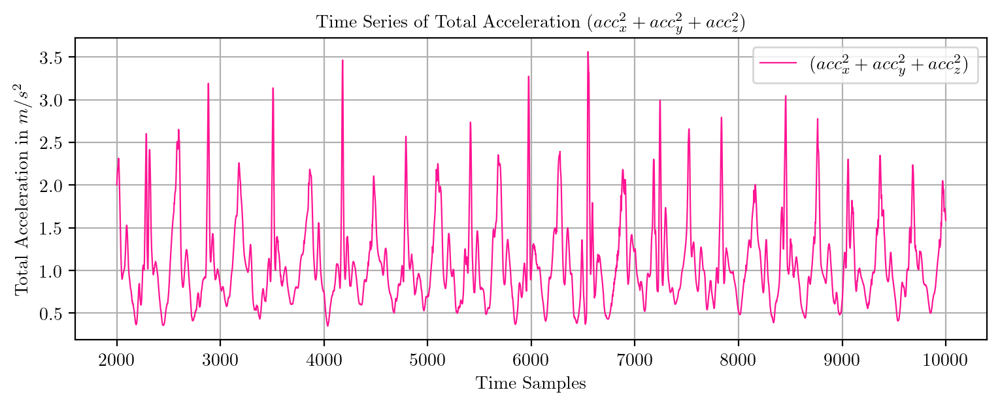

*** Feature extraction started ***



*** Feature extraction finished ***
STANDING


In [100]:
PredictPlot("TS37Upstairs.csv", 0, 2000, 10000)

Trimmed Time Series


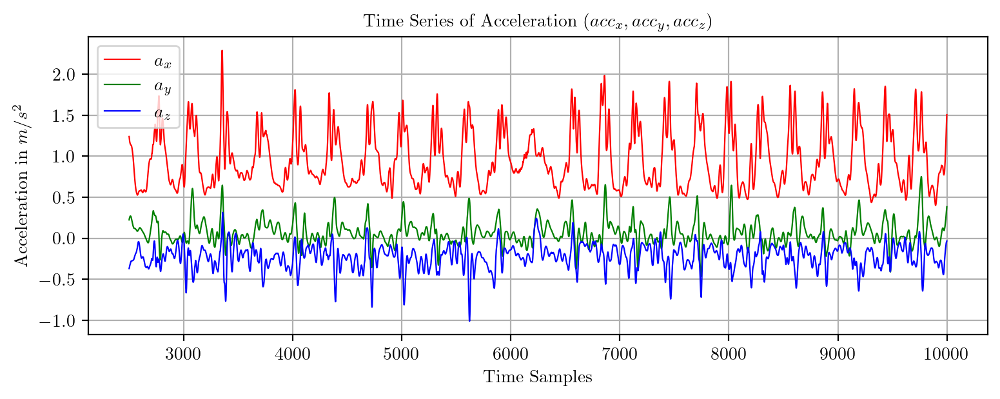

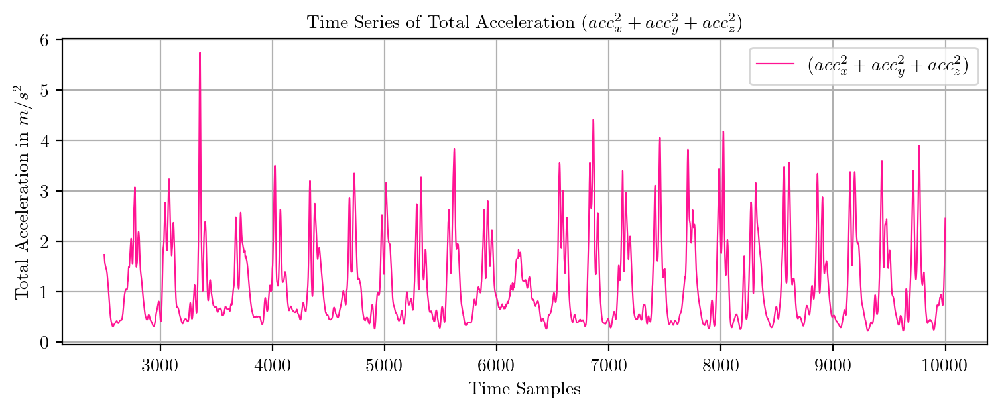

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_DOWNSTAIRS


In [102]:
PredictPlot("TS38Downstairs.csv", 0, 2500, 10000)

Trimmed Time Series


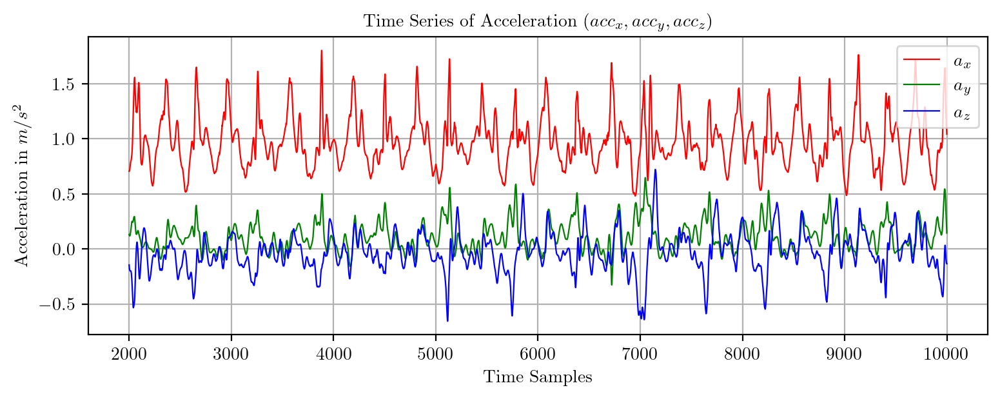

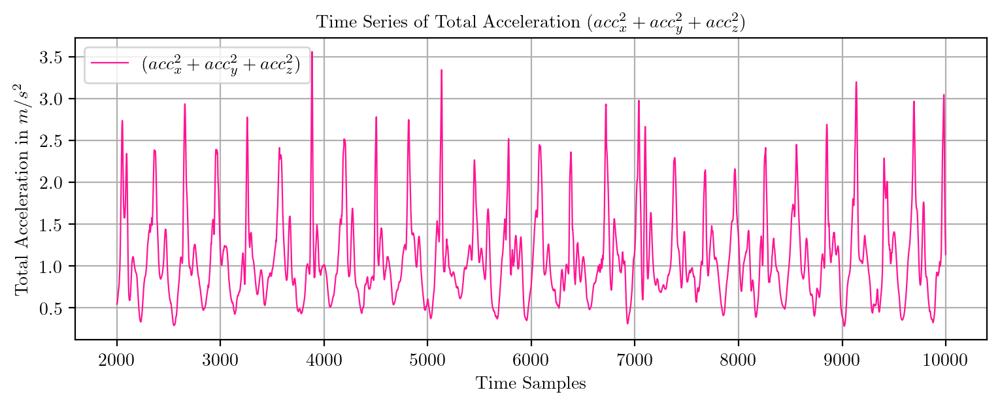

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_UPSTAIRS


In [104]:
PredictPlot("TS39Upstairs.csv", 0, 2000, 10000)

Trimmed Time Series


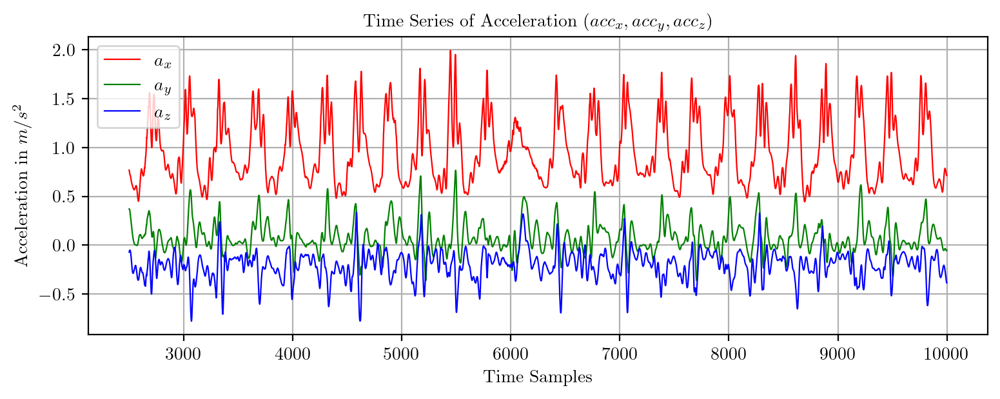

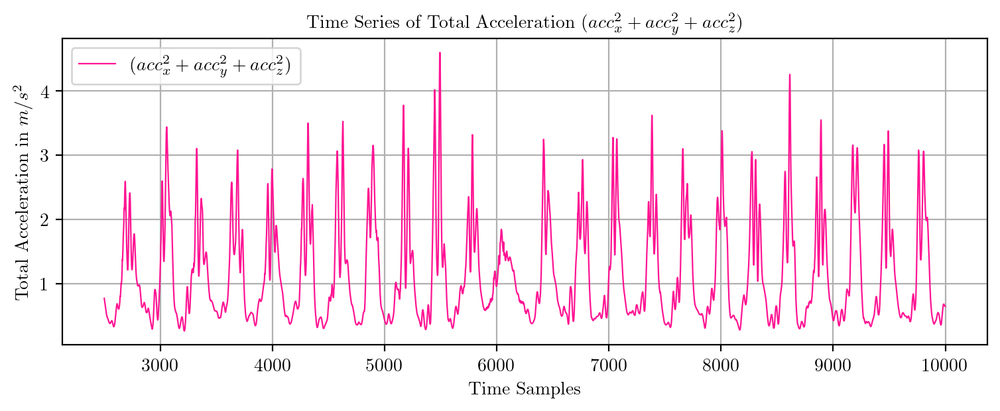

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_UPSTAIRS


In [106]:
PredictPlot("TS40Downstairs.csv", 0, 2500, 10000)

Trimmed Time Series


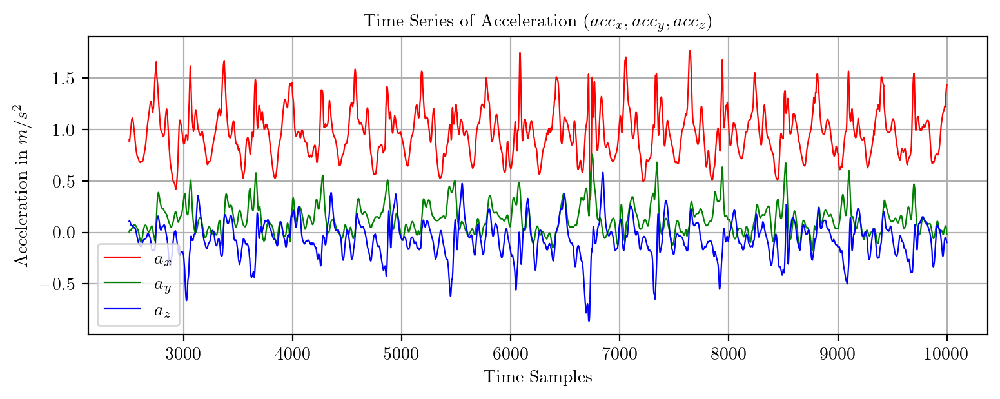

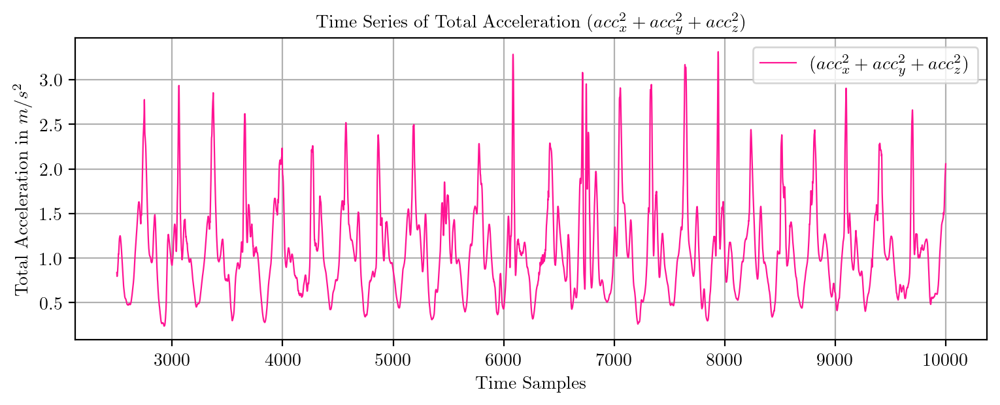

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_UPSTAIRS


In [108]:
PredictPlot("TS41Upstairs.csv", 0, 2500, 10000)

Trimmed Time Series


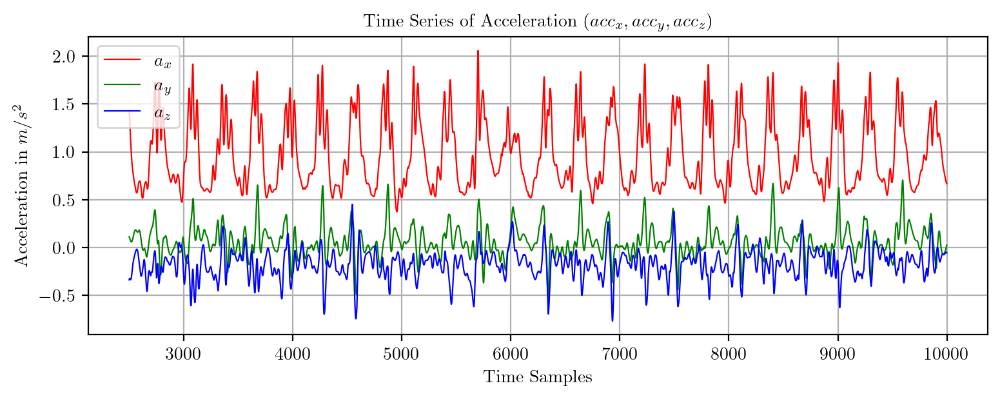

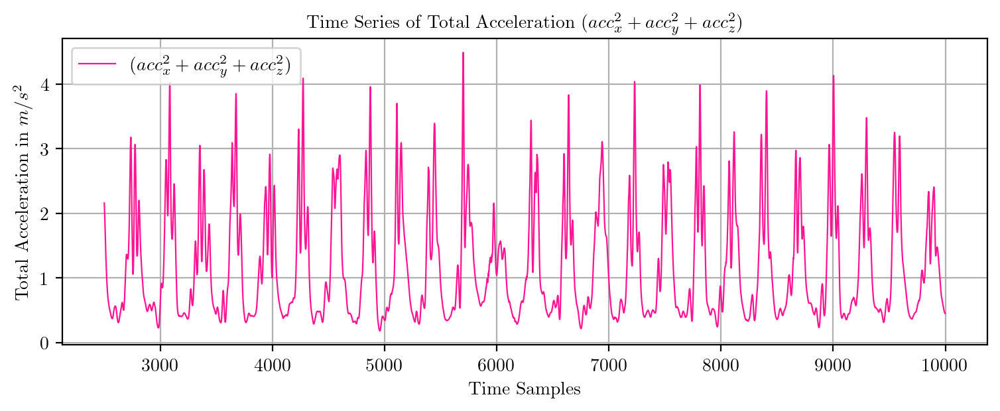

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_DOWNSTAIRS


In [110]:
PredictPlot("TS42Downstairs.csv", 0, 2500, 10000)

Trimmed Time Series


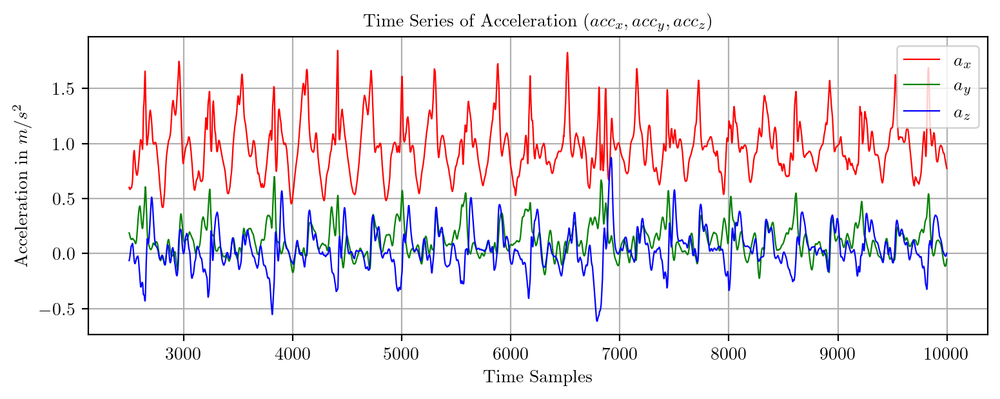

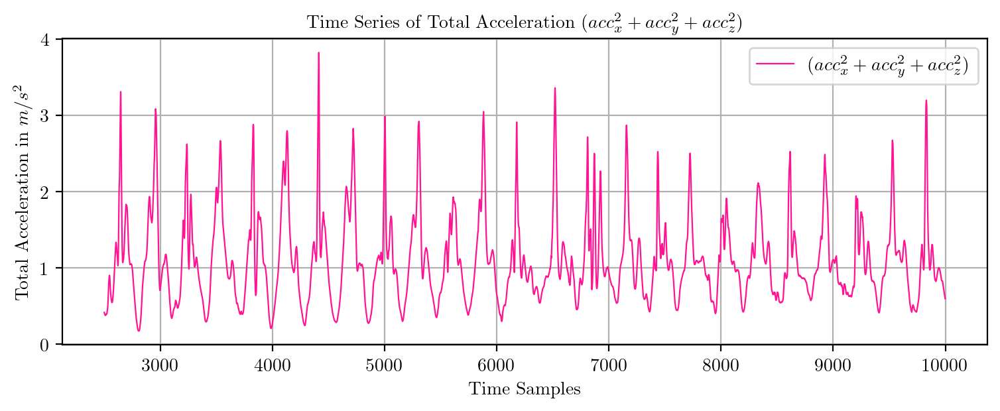

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_UPSTAIRS


In [112]:
PredictPlot("TS43Upstairs.csv", 0, 2500, 10000)

Trimmed Time Series


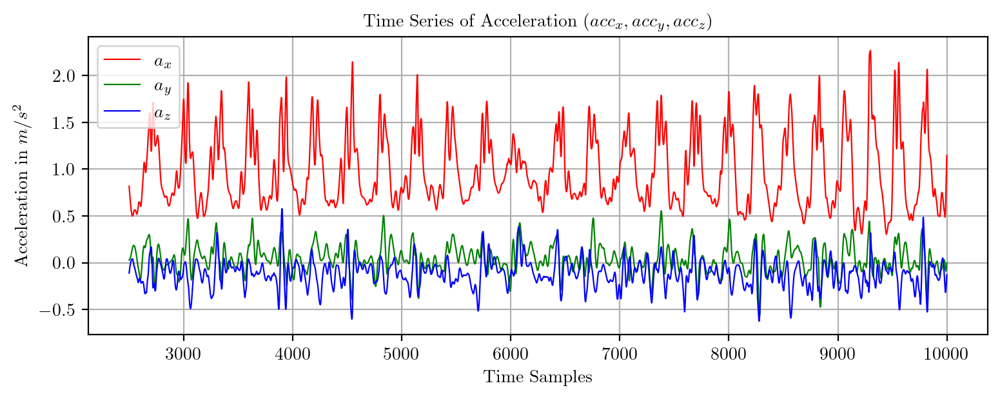

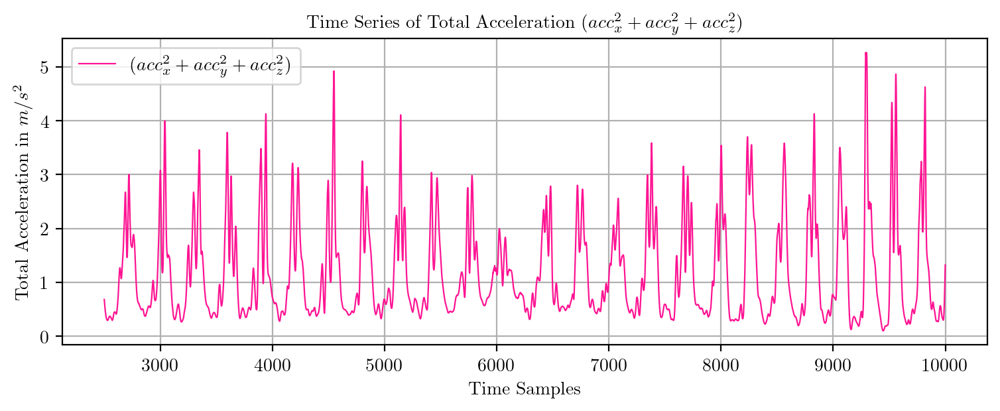

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_DOWNSTAIRS


In [114]:
PredictPlot("TS44Downstairs.csv", 0, 2500, 10000)

Trimmed Time Series


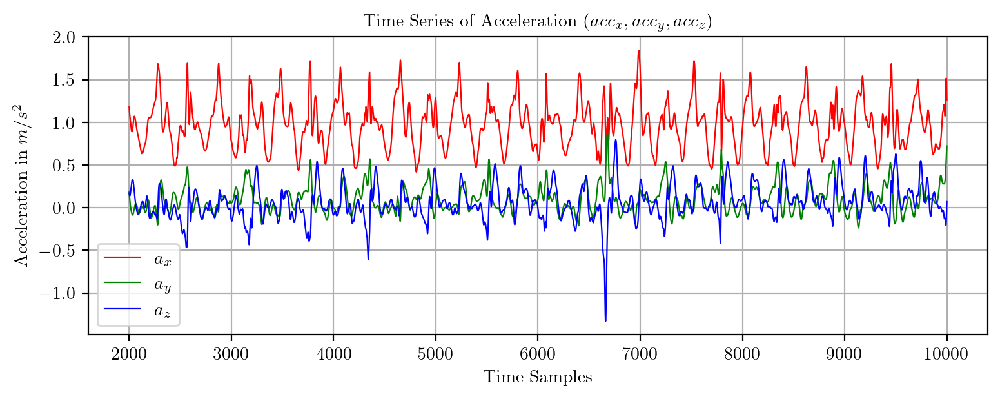

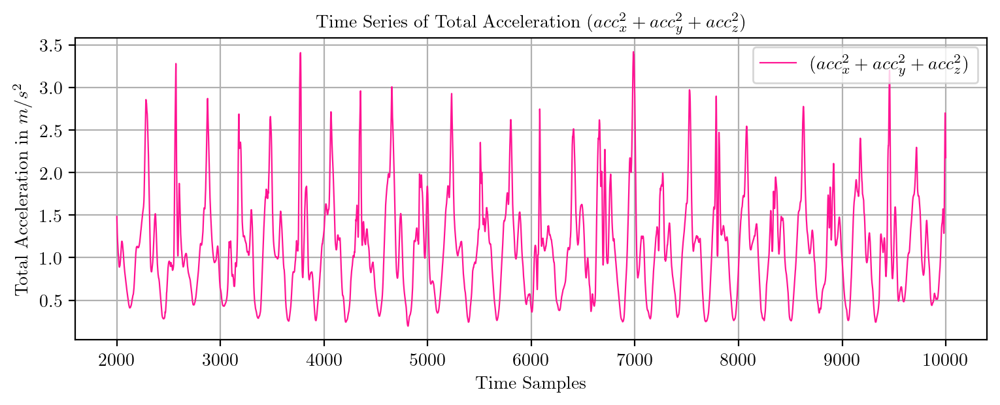

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_UPSTAIRS


In [116]:
PredictPlot("TS45Upstairs.csv", 0, 2000, 10000)

Trimmed Time Series


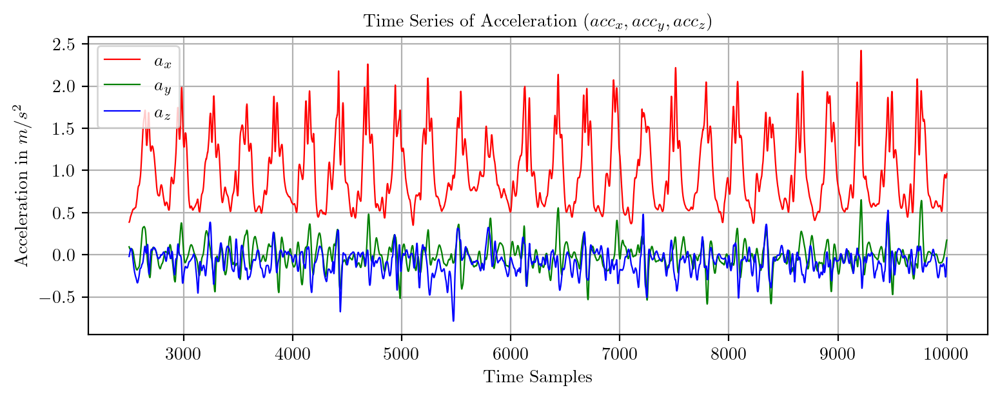

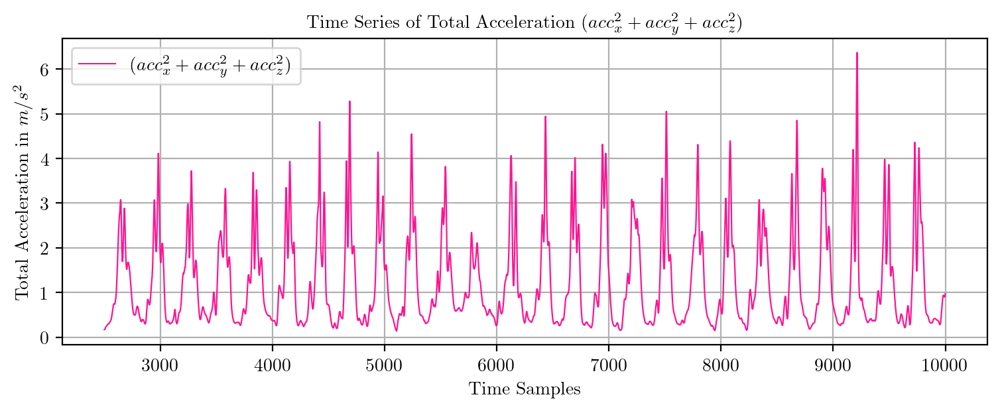

*** Feature extraction started ***



*** Feature extraction finished ***
WALKING_DOWNSTAIRS


In [118]:
PredictPlot("TS46Downstairs.csv", 0, 2500, 10000)

In [119]:
classesN

{1: 'WALKING',
 2: 'WALKING_UPSTAIRS',
 3: 'WALKING_DOWNSTAIRS',
 4: 'SITTING',
 5: 'STANDING',
 6: 'LAYING'}

In [121]:
y = [1, 4, 2, 3, 3, 2, 4, 5, 5, 4, 5, 1, 6, 4, 4, 4, 4, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 1, 1, 1, 1, 1, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3]
y_pred = [1, 4, 2, 3, 3, 5, 4, 4, 4, 4, 6, 6, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 6, 6, 6, 6, 6, 1, 1, 1, 2, 1, 5, 3, 2, 2, 2, 3, 2, 3, 2, 3]

42 42


In [123]:
cm = confusion_matrix(y, y_pred)
df_cm = pd.DataFrame(cm, index = [classT for classT in classes], columns = [classT for classT in classes])
df_cm

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
WALKING,5,1,0,0,0,1
WALKING_UPSTAIRS,0,5,0,0,2,0
WALKING_DOWNSTAIRS,0,1,6,0,0,0
SITTING,0,0,0,7,0,0
STANDING,0,0,0,7,0,1
LAYING,0,0,0,1,0,5


In [124]:
print(classification_report(y, y_pred, labels = np.unique(y_pred)))

              precision    recall  f1-score   support

           1       1.00      0.71      0.83         7
           2       0.71      0.71      0.71         7
           3       1.00      0.86      0.92         7
           4       0.47      1.00      0.64         7
           5       0.00      0.00      0.00         8
           6       0.71      0.83      0.77         6

    accuracy                           0.67        42
   macro avg       0.65      0.69      0.65        42
weighted avg       0.63      0.67      0.63        42



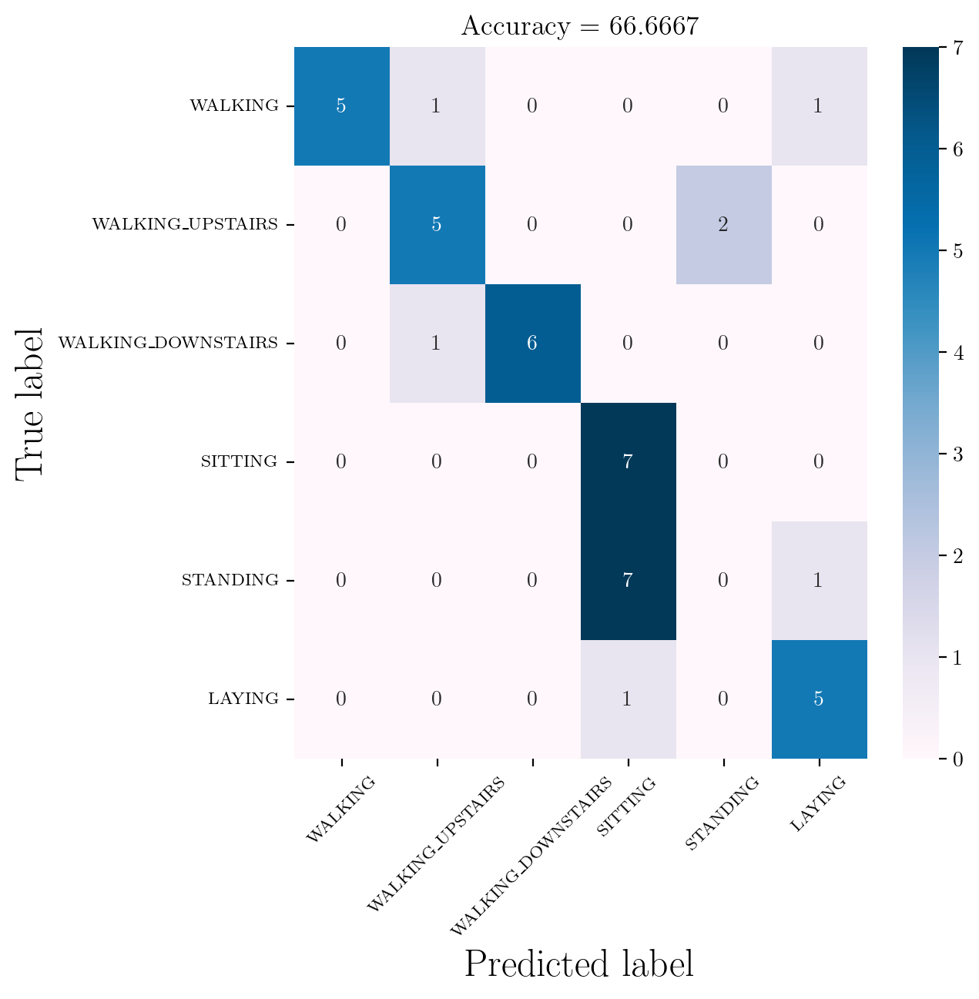

In [125]:
confMatrix(df_cm, 1)